# NIS800-53 analysis using Overlapping Communities




This notebook is the next phase after [NIS800-53 analysis 2](https://github.com/lior0110/regulations_analysis/blob/main/NIS800-53%20analysis%202.ipynb).
Here we will try to use the [CDlib library](https://cdlib.readthedocs.io/en/latest/index.html) to try to have better Community Detection, including having overlapping communities like we suggested in the previous notebook.

The goal of this notebook is to explore the better Community Detection methods given by CDlib for our goal of regrouping the NIS800-53 cybersecurity regulations.
For the relationship measures we will use the same ones we ended up with in [NIS800-53 analysis 2](https://github.com/lior0110/regulations_analysis/blob/main/NIS800-53%20analysis%202.ipynb).

In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

import seaborn as sns

import networkx as nx

import google.generativeai as genai
from google.api_core import retry

import os
import time
import xlsxwriter

# import all the helping functions that were written in the base NIS800-53 analysis notebook
from helping_functions import *

from cdlib import algorithms, NodeClustering, viz 


# Read the NIS800-53 regulations with the new NLP-based related controls

In [3]:

# NIS_regulations = pd.read_excel("regulations//sp800-53r5-control-catalog.xlsx")
# NIS_regulations = pd.read_feather("regulations//Active_NIS_regulations_with_new_related_controls.feather")
# NIS_regulations = pd.read_parquet("regulations//Active_NIS_regulations_with_new_related_controls.parquet")
# # Constructed so any of the new "related controls" columns will give a similar number of connections to the default "related controls"
# NIS_regulations = pd.read_feather("regulations//Active_NIS_regulations_with_new_related_controls2L.feather")
# NIS_regulations = pd.read_feather("regulations//Active_NIS_regulations_with_new_related_controls2.feather")
# Constructed so the combination of the new "related controls" columns will give a similar number of connections to the default "related controls"
# NIS_regulations = pd.read_feather("regulations//Active_NIS_regulations_with_new_related_controls2M.feather")
NIS_regulations = pd.read_feather("regulations//Active_NIS_regulations_with_new_related_controls2M+1.feather")
# NIS_regulations = pd.read_feather("regulations//Active_NIS_regulations_with_new_related_controls2M+2.feather")
NIS_regulations

# remove every key with None value for the new relations columns and sort them from highest to lowest

NIS_regulations.loc[:, "bm25 Related Controls"] = NIS_regulations.loc[:, "bm25 Related Controls"].apply(lambda x: {k: v for k, v in x.items() if v is not None}).apply(lambda x: dict(sorted(x.items(), key=lambda item: item[1], reverse=True)))
NIS_regulations.loc[:, "normalized bm25 Related Controls"] = NIS_regulations.loc[:, "normalized bm25 Related Controls"].apply(lambda x: {k: v for k, v in x.items() if v is not None}).apply(lambda x: dict(sorted(x.items(), key=lambda item: item[1], reverse=True)))

NIS_regulations.loc[:, "SentenceTransformer Related Controls"] = NIS_regulations.loc[:, "SentenceTransformer Related Controls"].apply(lambda x: {k: v for k, v in x.items() if v is not None}).apply(lambda x: dict(sorted(x.items(), key=lambda item: item[1], reverse=True)))

NIS_regulations.loc[:, "SaaS Related Controls"] = NIS_regulations.loc[:, "SaaS Related Controls"].apply(lambda x: {k: v for k, v in x.items() if v is not None}).apply(lambda x: dict(sorted(x.items(), key=lambda item: item[1], reverse=True)))
# NIS_regulations.loc[:, "bm25 Related Controls"] = NIS_regulations.loc[:, "bm25 Related Controls"].apply(lambda x: {k: v for k, v in x.items() if v is not None})
# NIS_regulations.loc[:, "normalized bm25 Related Controls"] = NIS_regulations.loc[:, "normalized bm25 Related Controls"].apply(lambda x: {k: v for k, v in x.items() if v is not None})
# NIS_regulations.loc[:, "SentenceTransformer Related Controls"] = NIS_regulations.loc[:, "SentenceTransformer Related Controls"].apply(lambda x: {k: v for k, v in x.items() if v is not None})
# NIS_regulations.loc[:, "SaaS Related Controls"] = NIS_regulations.loc[:, "SaaS Related Controls"].apply(lambda x: {k: v for k, v in x.items() if v is not None})

NIS_regulations


,Control Identifier,Control (or Control Enhancement) Name,Control Text,Discussion,Related Controls,Main Control Name,Family Name,Related Controls Dictionary,Full Text,bm25 Related Controls,normalized bm25 Related Controls,SentenceTransformer Related Controls,SaaS Related Controls
0,AC-1,Policy and Procedures,"a. Develop, document, and disseminate to [Assi...",Access control policy and procedures address t...,"IA-1, PM-9, PM-24, PS-8, SI-12 .",AC-1,AC,"{'AC-1': None, 'AC-10': None, 'AC-11': None, '...","Policy and Procedures\n\na. Develop, document,...","{'MA-1': 59.27978515625, 'PL-1': 59.2797851562...","{'MA-1': 0.8947177027189795, 'PL-1': 0.8947177...","{'PS-1': 0.9554650187492371, 'CA-1': 0.9547808...","{'CA-1': 0.9555830106820367, 'SC-1': 0.9506337..."
1,AC-2,Account Management,a. Define and document the types of accounts a...,Examples of system account types include indiv...,"AC-3, AC-5, AC-6, AC-17, AC-18, AC-20, AC-24, ...",AC-2,AC,"{'AC-1': None, 'AC-10': None, 'AC-11': None, '...",Account Management\n\na. Define and document t...,"{'AC-2(3)': 63.61791229248047, 'AC-2(7)': 62.1...","{'AC-2(3)': 0.5456564097423026, 'AC-2(7)': 0.5...","{'AC-2(7)': 0.872290849685669, 'AC-2(11)': 0.8...","{'AC-2(7)': 0.8690222363681739, 'AC-2(11)': 0...."
2,AC-2(1),Account Management | Automated System Account ...,Support the management of system accounts usin...,Automated system account management includes u...,None.,AC-2,AC,"{'AC-1': None, 'AC-10': None, 'AC-11': None, '...",Account Management | Automated System Account ...,"{'AC-2(2)': 13.920116424560547, 'AC-2(8)': 13....","{'AC-2(2)': 0.6856685718365872, 'AC-2(8)': 0.6...","{'AC-2(8)': 0.839957594871521, 'IR-4(1)': 0.80...","{'AC-2(8)': 0.8385143606316967, 'AC-2(11)': 0...."
3,AC-2(2),Account Management | Automated Temporary and E...,Automatically [Selection: remove; disable] tem...,Management of temporary and emergency accounts...,None.,AC-2,AC,"{'AC-1': None, 'AC-10': None, 'AC-11': None, '...",Account Management | Automated Temporary and E...,"{'AC-2(4)': 18.166128158569336, 'AC-2(3)': 16....","{'AC-2(4)': 0.4500737751259309, 'AC-2(3)': 0.4...","{'AC-2(3)': 0.8158750534057617, 'AC-2(4)': 0.8...","{'AC-2(3)': 0.8327054165938192, 'AC-2(13)': 0...."
4,AC-2(3),Account Management | Disable Accounts,Disable accounts within [Assignment: organizat...,"Disabling expired, inactive, or otherwise anom...",None.,AC-2,AC,"{'AC-1': None, 'AC-10': None, 'AC-11': None, '...",Account Management | Disable Accounts\n\nDisab...,"{'AC-2(13)': 23.608457565307617, 'AC-2(2)': 20...","{'AC-2(13)': 0.5667917968522473, 'AC-2(2)': 0....","{'AC-2(13)': 0.8616952300071716, 'AC-2(5)': 0....","{'AC-2(13)': 0.8635755082149525, 'AC-2(2)': 0...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1184,SR-11,Component Authenticity,a. Develop and implement anti-counterfeit poli...,Sources of counterfeit components include manu...,"PE-3, SA-4, SI-7, SR-9, SR-10.",SR-11,SR,"{'AC-1': None, 'AC-10': None, 'AC-11': None, '...",Component Authenticity\n\na. Develop and imple...,"{'SR-11(1)': 28.72646141052246, 'SR-11(3)': 26...","{'SR-11(1)': 0.6496216599515963, 'SR-11(3)': 0...","{'SR-11(1)': 0.8409214019775391, 'SR-11(3)': 0...","{'SR-11(1)': 0.8345096504298886, 'CM-8(3)': 0...."
1185,SR-11(1),Component Authenticity | Anti-counterfeit Trai...,Train [Assignment: organization-defined person...,None.,AT-3.,SR-11,SR,"{'AC-1': None, 'AC-10': None, 'AC-11': None, '...",Component Authenticity | Anti-counterfeit Trai...,"{'SR-11': 17.0235538482666, 'SR-11(3)': 15.025...","{'SR-11': 0.6172898806384338, 'SR-11(3)': 0.54...","{'SR-11(3)': 0.8443236947059631, 'SR-11': 0.84...","{'SR-11(3)': 0.8393997564526279, 'SR-11': 0.83..."
1186,SR-11(2),Component Authenticity | Configuration Control...,Maintain configuration control over the follow...,None.,"CM-3, MA-2, MA-4, SA-10.",SR-11,SR,"{'AC-1': None, 'AC-10': None, 'AC-11': None, '...",Component Authenticity | Configuration Control...,{'SA-4(5)': 16.491981506347656},{'SA-4(5)': 0.3748

In [4]:

family_column = "Family Name"

# group by family name and count the number of regulations in each family
NIS_regulations.groupby(by=[family_column]).apply(len,include_groups=False).mean()
# now interquntile



50.35

In [5]:

NIS_regulations.loc[1,"normalized bm25 Related Controls"]
# NIS_regulations.loc[1,["bm25 Related Controls","normalized bm25 Related Controls","SentenceTransformer Related Controls","SaaS Related Controls"]]
# NIS_regulations.loc[0,"bm25 Related Controls"].keys()
# type(NIS_regulations.loc[0,"bm25 Related Controls"])

# print all key value pairs in NIS_regulations.loc[1,"normalized bm25 Related Controls"]
for k, v in NIS_regulations.loc[1,"normalized bm25 Related Controls"].items():
    print(f"{k}: {v}")
    print("-"*80)
    




AC-2(3): 0.5456564097423026
--------------------------------------------------------------------------------
AC-2(7): 0.5332102684763498
--------------------------------------------------------------------------------
AC-2(9): 0.5220074162177839
--------------------------------------------------------------------------------
AC-2(12): 0.5073050386463656
--------------------------------------------------------------------------------
AC-2(2): 0.497907489534503
--------------------------------------------------------------------------------
AC-2(13): 0.4820235309761175
--------------------------------------------------------------------------------
IA-2(5): 0.4703392514575003
--------------------------------------------------------------------------------
IA-5: 0.46017980787930934
--------------------------------------------------------------------------------
AC-2(8): 0.4444947807971446
--------------------------------------------------------------------------------
AC-6(2): 0.441447301

## transform the old Related Controls from the string NIS representation to the new Dictionary representation

In [6]:

# Related_Controls = row["Related Controls"].replace(" .","").replace(".","").split(", ")
# apply the replace and split operation on the Related Controls column to get a list of related controls
# NIS_regulations["Related Controls"].apply(lambda x: {k: v for k, v in (i.split("-") for i in x.replace(" .","").replace(".","").split(", ")) if v is not None else None })
new_NIS_Related_Controls = NIS_regulations["Related Controls"].apply(lambda x: x.replace(" .","").replace(".","").split(", "))
# transform the list of related controls into a dictionary where the key is the control and the value is 0.5
# new_NIS_Related_Controls[3]
# {x: 0.5 for x in new_NIS_Related_Controls[0] if x != "None"}
new_NIS_Related_Controls = new_NIS_Related_Controls.apply(lambda x: {k: 0.5 for k in x if k!= "None"})
NIS_regulations["Related Controls Dictionary"] = new_NIS_Related_Controls

new_NIS_Related_Controls


0       {'IA-1': 0.5, 'PM-9': 0.5, 'PM-24': 0.5, 'PS-8...
1       {'AC-3': 0.5, 'AC-5': 0.5, 'AC-6': 0.5, 'AC-17...
2                                                      {}
3                                                      {}
4                                                      {}
                              ...                        
1184    {'PE-3': 0.5, 'SA-4': 0.5, 'SI-7': 0.5, 'SR-9'...
1185                                        {'AT-3': 0.5}
1186    {'CM-3': 0.5, 'MA-2': 0.5, 'MA-4': 0.5, 'SA-10...
1187                                        {'RA-5': 0.5}
1188                                        {'MP-6': 0.5}
Name: Related Controls, Length: 1007, dtype: object

# Checking the "Related Controls" column

We want to know what the statistics are of all of the Related Controls columns (the original column and the new columns we have made).

## Run describe on the "Related Controls" column

In [7]:
NIS_regulations.loc[:,["Related Controls Dictionary","bm25 Related Controls","normalized bm25 Related Controls","SentenceTransformer Related Controls","SaaS Related Controls"]].describe(include="all")

,Related Controls Dictionary,bm25 Related Controls,normalized bm25 Related Controls,SentenceTransformer Related Controls,SaaS Related Controls
count,1007,1007,1007,1007,1007
unique,540,1007,1007,1007,1007
top,{},"{'MA-1': 59.27978515625, 'PL-1': 59.2797851562...","{'MA-1': 0.8947177027189795, 'PL-1': 0.8947177...","{'PS-1': 0.9554650187492371, 'CA-1': 0.9547808...","{'CA-1': 0.9555830106820367, 'SC-1': 0.9506337..."
freq,361,1,1,1,1


We can see that like in the human-made relations there are still some regulations that have no related controls.

## Look if the controls are mutually related
Two controls will be considered mutually related if control A or any of its sub-controls is related to control B or any of its sub-controls and control B or any of its sub-controls are also related to control A or any of its sub-controls.

We assume that related controls should be mutually related because there is no reason that if control A is related to control B control B will not be related to control A.

In order to check the mutual relations status and get relations statistics we will use the **'get_mutual_relations'** function from the **helping_functions**



In [8]:

relations_columns = ["Related Controls Dictionary","bm25 Related Controls","normalized bm25 Related Controls","SentenceTransformer Related Controls","SaaS Related Controls"]

# get the statistics for every individual relationship method
for relation_column in relations_columns:
    mutually_related, not_mutually_related, in_family_connection_statistics, relations_statistics = get_mutual_relations(NIS_regulations,relation_column,do_print=False)
    print(f'there are {len(not_mutually_related)} non-mutual connections in "{relation_column}"')
    print(f"in-family connections:\n{in_family_connection_statistics}")
    # print(f"Relations statistics:\n{relations_statistics}")
    s_r = sum(mutually_related["same family"]) / len(mutually_related)
    if len(not_mutually_related) > 0:
        s_r_n = sum(not_mutually_related["same family"]) / len(not_mutually_related)
    else:
        s_r_n = 0
    s = (sum(mutually_related["same family"]) + sum(not_mutually_related["same family"])) / (len(mutually_related) + len(not_mutually_related))
    print(f"{s:.2%} of existing connections are in-family")
    print(f"{s_r:.2%} of existing mutual connections are in-family")
    print(f"{s_r_n:.2%} of existing non-mutual connections are in-family")
    print("-"*100)
    

# get the statistics for a combination of the three human-independent relationship method (excluding the un-normalized bm25 Related Controls)
mutually_related, not_mutually_related, in_family_connection_statistics, relations_statistics = get_mutual_relations(NIS_regulations,relations_columns[2:],do_print=False)

print(f'there are {len(not_mutually_related)} non-mutual connections in "{relations_columns[2:]}"')
print(f"in-family connections:\n{in_family_connection_statistics}")
# print(f"Relations statistics:\n{relations_statistics}")
s_r = sum(mutually_related["same family"]) / len(mutually_related)
if len(not_mutually_related) > 0:
    s_r_n = sum(not_mutually_related["same family"]) / len(not_mutually_related)
else:
    s_r_n = 0
s = (sum(mutually_related["same family"]) + sum(not_mutually_related["same family"])) / (len(mutually_related) + len(not_mutually_related))
print(f"{s:.2%} of existing connections are in-family")
print(f"{s_r:.2%} of existing mutual connections are in-family")
print(f"{s_r_n:.2%} of existing non-mutual connections are in-family")
print("-"*100)



there are 645 non-mutual connections in "Related Controls Dictionary"
in-family connections:
number of families                                                                                                     20.000000
mean number of controls in family                                                                                      14.900000
median number of controls in family                                                                                    12.000000
std of number of controls in family                                                                                    10.187195
Inter-quartile range of number of controls in family                                                                    9.500000
number of participating controls                                                                                      298.000000
balance score 1 (mean/std)(higher better)                                                                               1.462620
bala

For the related controls we got from "bm25 Related Controls", we see a lot of non-mutual connections, 1567 compared to 645 from the human-made relations. This may be because the BM25 score function is not commutative so the distance from control A to control B is not the same as from control B to control A. Apart from that, the non-normalized bm25 scores look different from all the other tested methods, and it gives worse statistical indicators than them and the human-made relations.

For the related controls we got from "normalized bm25 Related Controls", we see some non-mutual connections, 1014 compared to 645 from the human-made relations. This is probably due to the score normalization step we used.

For the related controls we got from "SentenceTransformer Related Controls" and "SaaS Related Controls" we got 0 non-mutual connections. This is because the scores from them are normalized by default and because they are commutative so the distance from control A to control B is the same as from control B to control A.

Furthermore (Apart from the "bm25 Related Controls" scores), the statistics of the in-family connections are all on similar levels to what we got from the human-made relations for the three individual human-independent relationship method. 

The combination of the three individual human-independent relationship methods, "normalized bm25 Related Controls, "SentenceTransformer Related Controls," and "SaaS Related Controls," gives a similar number of non-mutual connections to the human-made connections, 675 compared to 645.
The combined result also shows more than 60% more connections than the individual methods, saying that the connections from the three individual human-independent relationship methods do not completely overlap but still have some base similarities.

The statistical indicators of the combined result are lower than the human-made baseline, which may be expected because of the results we saw in the first analysis [NIS800-53 analysis](https://github.com/lior0110/regulations_analysis/blob/main/NIS800-53%20analysis.ipynb).
But combined with the statistical indicators of the individual human-independent relationship method being similar to the human-made baseline, may say that each one of the three human-independent relationship methods see small aspects that the other two methods don't see.

# Try CDlib for community detection

[CDlib library](https://cdlib.readthedocs.io/en/latest/index.html) also gives us their own scores metrics that we will use for the assessment with our balance scores.

In [9]:


def calc_scores(coms):
    scores = pd.DataFrame()
    scores.loc["mean_size", ["min","max","score","std"]] = [coms.size().min, coms.size().max, coms.size().score, coms.size().std]
    scores.loc["num_communities", ["score",]] = [len(coms.size(summary=False)),]
    # if coms.overlap:
    scores.loc["balance score 1 (mean/std)(higher better)", ["min","max","score","std"]] = [None, None, 0, None]
    scores.loc["balance score 2 (median/Inter-quartile range)(higher better)", ["min","max","score","std"]] = [None, None, 0, None]
    scores.loc["link_modularity (higher better)", ["min","max","score","std"]] = [coms.link_modularity().min, coms.link_modularity().max, coms.link_modularity().score, coms.link_modularity().std]
    scores.loc["normalized_cut (lower better)", ["min","max","score","std"]] = [coms.normalized_cut().min, coms.normalized_cut().max, coms.normalized_cut().score, coms.normalized_cut().std]
    scores.loc["internal_edge_density (higher better)", ["min","max","score","std"]] = [coms.internal_edge_density().min, coms.internal_edge_density().max, coms.internal_edge_density().score, coms.internal_edge_density().std]
    scores.loc["average_internal_degree (higher better)", ["min","max","score","std"]] = [coms.average_internal_degree().min, coms.average_internal_degree().max, coms.average_internal_degree().score, coms.average_internal_degree().std]
    scores.loc["fraction_over_median_degree (higher better)", ["min","max","score","std"]] = [coms.fraction_over_median_degree().min, coms.fraction_over_median_degree().max, coms.fraction_over_median_degree().score, coms.fraction_over_median_degree().std]
    scores.loc["expansion (lower better)", ["min","max","score","std"]] = [coms.expansion().min, coms.expansion().max, coms.expansion().score, coms.expansion().std]
    scores.loc["cut_ratio (lower better)", ["min","max","score","std"]] = [coms.cut_ratio().min, coms.cut_ratio().max, coms.cut_ratio().score, coms.cut_ratio().std]
    scores.loc["edges_inside (higher better)", ["min","max","score","std"]] = [coms.edges_inside().min, coms.edges_inside().max, coms.edges_inside().score, coms.edges_inside().std]
    scores.loc["conductance (lower better)", ["min","max","score","std"]] = [coms.conductance().min, coms.conductance().max, coms.conductance().score, coms.conductance().std]
    # if coms.overlap:
    scores.loc["max_odf (lower better)", ["min","max","score","std"]] = [coms.max_odf().min, coms.max_odf().max, coms.max_odf().score, coms.max_odf().std]
    scores.loc["avg_odf (lower better)", ["min","max","score","std"]] = [coms.avg_odf().min, coms.avg_odf().max, coms.avg_odf().score, coms.avg_odf().std]
    scores.loc["flake_odf (lower better)", ["min","max","score","std"]] = [coms.flake_odf().min, coms.flake_odf().max, coms.flake_odf().score, coms.flake_odf().std]
    scores.loc["triangle_participation_ratio (higher better)", ["min","max","score","std"]] = [coms.triangle_participation_ratio().min, coms.triangle_participation_ratio().max, coms.triangle_participation_ratio().score, coms.triangle_participation_ratio().std]
    scores.loc["newman_girvan_modularity (higher better)", ["min","max","score","std"]] = [coms.newman_girvan_modularity().min, coms.newman_girvan_modularity().max, coms.newman_girvan_modularity().score, coms.newman_girvan_modularity().std]
    scores.loc["erdos_renyi_modularity (higher better)", ["min","max","score","std"]] = [coms.erdos_renyi_modularity().min, coms.erdos_renyi_modularity().max, coms.erdos_renyi_modularity().score, coms.erdos_renyi_modularity().std]
    scores.loc["modularity_density (higher better)", ["min","max","score","std"]] = [coms.modularity_density().min, coms.modularity_density().max, coms.modularity_density().score, coms.modularity_density().std]
    scores.loc["z_modularity (higher better)", ["min","max","score","std"]] = [coms.z_modularity().min, coms.z_modularity().max, coms.z_modularity().score, coms.z_modularity().std]
    scores.loc["modularity_overlap (higher better)", ["min","max","score","std"]] = [coms.modularity_overlap(weight=weightName).min, coms.modularity_overlap(weight=weightName).max, coms.modularity_overlap(weight=weightName).score, coms.modularity_overlap(weight=weightName).std]
    scores.loc["surprise (higher better)", ["min","max","score","std"]] = [coms.surprise().min, coms.surprise().max, coms.surprise().score, coms.surprise().std]
    scores.loc["significance (higher better)", ["min","max","score","std"]] = [coms.significance().min, coms.significance().max, coms.significance().score, coms.significance().std]
    scores.loc["scaled_density (lower better)", ["min","max","score","std"]] = [coms.scaled_density().min, coms.scaled_density().max, coms.scaled_density().score, coms.scaled_density().std]
    scores.loc["avg_distance (higher better)", ["min","max","score","std"]] = [coms.avg_distance().min, coms.avg_distance().max, coms.avg_distance().score, coms.avg_distance().std]
    scores.loc["hub_dominance (higher better)", ["min","max","score","std"]] = [coms.hub_dominance().min, coms.hub_dominance().max, coms.hub_dominance().score, coms.hub_dominance().std]
    scores.loc["avg_transitivity (lower better)", ["min","max","score","std"]] = [coms.avg_transitivity().min, coms.avg_transitivity().max, coms.avg_transitivity().score, coms.avg_transitivity().std]
    scores.loc["avg_embeddedness (higher better)", ["min","max","score","std"]] = [coms.avg_embeddedness().min, coms.avg_embeddedness().max, coms.avg_embeddedness().score, coms.avg_embeddedness().std]
    
    scores.loc["balance score 1 (mean/std)(higher better)", "score"] = scores.loc["mean_size", "score"] / scores.loc["mean_size", "std"]
    sizes = np.array(coms.size(summary=False))
    if len(sizes) > 0:
        scores.loc["balance score 2 (median/Inter-quartile range)(higher better)", "score"] = np.median(sizes) / (np.percentile(sizes, 75) - np.percentile(sizes, 25))
    else:
        scores.loc["balance score 2 (median/Inter-quartile range)(higher better)", "score"] = 0

    return scores

## Crisp Communities

We will start by checking all the given [Crisp Communities](https://cdlib.readthedocs.io/en/latest/reference/cd_algorithms/node_clustering.html#crisp-communities)(non-overlapping) methods, to find the best ones for us.
Firstly we want to have good balance of community sizes.

In [12]:
# from cdlib import NodeClustering

# defult_communities = NodeClustering()
NIS_regulations
defult_communities_list = []
for family in NIS_regulations[family_column].unique():
    defult_communities_list.append(list(NIS_regulations[NIS_regulations[family_column] == family]["Main Control Name"].unique()))
defult_communities_list




[['AC-1',
  'AC-2',
  'AC-3',
  'AC-4',
  'AC-5',
  'AC-6',
  'AC-7',
  'AC-8',
  'AC-9',
  'AC-10',
  'AC-11',
  'AC-12',
  'AC-14',
  'AC-16',
  'AC-17',
  'AC-18',
  'AC-19',
  'AC-20',
  'AC-21',
  'AC-22',
  'AC-23',
  'AC-24',
  'AC-25'],
 ['AT-1', 'AT-2', 'AT-3', 'AT-4', 'AT-6'],
 ['AU-1',
  'AU-2',
  'AU-3',
  'AU-4',
  'AU-5',
  'AU-6',
  'AU-7',
  'AU-8',
  'AU-9',
  'AU-10',
  'AU-11',
  'AU-12',
  'AU-13',
  'AU-14',
  'AU-16'],
 ['CA-1', 'CA-2', 'CA-3', 'CA-5', 'CA-6', 'CA-7', 'CA-8', 'CA-9'],
 ['CM-1',
  'CM-2',
  'CM-3',
  'CM-4',
  'CM-5',
  'CM-6',
  'CM-7',
  'CM-8',
  'CM-9',
  'CM-10',
  'CM-11',
  'CM-12',
  'CM-13',
  'CM-14'],
 ['CP-1',
  'CP-2',
  'CP-3',
  'CP-4',
  'CP-6',
  'CP-7',
  'CP-8',
  'CP-9',
  'CP-10',
  'CP-11',
  'CP-12',
  'CP-13'],
 ['IA-1',
  'IA-2',
  'IA-3',
  'IA-4',
  'IA-5',
  'IA-6',
  'IA-7',
  'IA-8',
  'IA-9',
  'IA-10',
  'IA-11',
  'IA-12'],
 ['IR-1', 'IR-2', 'IR-3', 'IR-4', 'IR-5', 'IR-6', 'IR-7', 'IR-8', 'IR-9'],
 ['MA-1', 'MA-2', 

In [13]:
relations_columns = ["Related Controls Dictionary","bm25 Related Controls","normalized bm25 Related Controls","SentenceTransformer Related Controls","SaaS Related Controls"]

is_directed:bool = False
is_Main_Controls_Only:bool = True
is_Weighted:bool = True

add_groups_summaries:bool = False

i:int=1
Relations = relations_columns[2:] # use the original "Related Controls" column

Related_Controls_Graph = make_network_graph_from_relations(NIS_regulations, Relations, 
                                                           is_directed=is_directed, is_Main_Controls_Only=is_Main_Controls_Only, is_Weighted=is_Weighted)

defult_communities = NodeClustering(defult_communities_list, graph=Related_Controls_Graph.copy(), method_name="Default NIS800-53 Communities", overlap=False)

# k = NIS_regulations["Family Name"].nunique()
# coms = algorithms.agdl(Related_Controls_Graph.copy(), number_communities=3, kc=4) 
# coms = algorithms.async_fluid(Related_Controls_Graph.copy(),k=k)
# coms = algorithms.belief(Related_Controls_Graph.copy(), max_it = 100, eps = 0.0001, reruns_if_not_conv = 10, threshold = 0.005, q_max = 1.5*k) # maybe
# coms = algorithms.der(Related_Controls_Graph.copy(), walk_len = 3, threshold = 0.00001, iter_bound = 500)
# coms = algorithms.eigenvector(Related_Controls_Graph) # maybe
# coms = algorithms.em(Related_Controls_Graph.copy(), k=k)
# coms = algorithms.ga(Related_Controls_Graph.copy(), population = 300, generation = 30, r = 1.5) # maybe
# coms = algorithms.gdmp2(Related_Controls_Graph.copy(),min_threshold=0.75)
# coms = algorithms.girvan_newman(Related_Controls_Graph.copy(), level=10)
# coms = algorithms.head_tail(Related_Controls_Graph.copy(), head_tail_ratio=0.4)
# coms = algorithms.kcut(Related_Controls_Graph.copy(), kmax=10)
# coms = algorithms.label_propagation(Related_Controls_Graph)
# coms = algorithms.lswl(Related_Controls_Graph.copy(), "AC-1", strength_type=2, timeout= 60,online= True)
# coms = algorithms.lswl_plus(Related_Controls_Graph.copy(), strength_type=1, merge_outliers= True, detect_overlap= False) # not working
# coms = algorithms.markov_clustering(Related_Controls_Graph.copy(), expansion = 3, inflation = 4, loop_value = 1, iterations = 10000, pruning_threshold = 0.001, pruning_frequency = 1, convergence_check_frequency = 1)
# coms = algorithms.mod_m(Related_Controls_Graph.copy(), "AC-1")
# coms = algorithms.mod_r(Related_Controls_Graph.copy(), "AC-1")
# coms = algorithms.paris(Related_Controls_Graph)
# coms = algorithms.ricci_community(Related_Controls_Graph.copy(), alpha=0.5,method="Sinkhorn") # not working
# coms = algorithms.r_spectral_clustering(Related_Controls_Graph.copy(), n_clusters=k, method="regularized", percentile=20)
# coms = algorithms.scan(Related_Controls_Graph.copy(), epsilon=0.35, mu=4)
# coms = algorithms.significance_communities(Related_Controls_Graph)
# coms = algorithms.spinglass(Related_Controls_Graph.copy(), spins= 2*k)
# coms = algorithms.walktrap(Related_Controls_Graph)
# coms = algorithms.sbm_dl(Related_Controls_Graph) # not working
# coms = algorithms.sbm_dl_nested(Related_Controls_Graph) # not working
# coms = algorithms.spectral(Related_Controls_Graph.copy(), kmax=2*k, projection_on_smaller_class=False)
# coms = algorithms.threshold_clustering(Related_Controls_Graph.copy(), threshold_function=np.mean) # not working

# Long time
# coms = algorithms.bayan(Related_Controls_Graph.copy(), threshold = 0.001, time_allowed = 60, resolution = 1)


# Weighted Methods
# weightName="Weight"
# coms = algorithms.cpm(Related_Controls_Graph.copy(), weights=weightName, resolution_parameter=0.01,)
# coms = algorithms.greedy_modularity(Related_Controls_Graph.copy(), weight=weightName)
# coms = algorithms.infomap(Related_Controls_Graph.copy(), flags=weightName)
# coms = algorithms.leiden(Related_Controls_Graph.copy(), weights=weightName)
# coms = algorithms.louvain(Related_Controls_Graph.copy(), weight=weightName, resolution=1.)
# coms = algorithms.mcode(Related_Controls_Graph.copy(), weights=weightName, weight_threshold=0.2)
# coms = algorithms.pycombo(Related_Controls_Graph.copy(), weight=weightName,max_communities=2*k, modularity_resolution=2.0, num_split_attempts=0, start_separate= False, treat_as_modularity= False)
# coms = algorithms.rber_pots(Related_Controls_Graph.copy(),weights=weightName, resolution_parameter=0.5)
# coms = algorithms.rb_pots(Related_Controls_Graph.copy(),weights=weightName, resolution_parameter=1)
# coms = algorithms.surprise_communities(Related_Controls_Graph.copy(), weights=weightName)


# to consider:
k = NIS_regulations["Family Name"].nunique()
weightName="Weight"
Crisp_Communities = {}
# coms = algorithms.async_fluid(Related_Controls_Graph.copy(),k=k)
Crisp_Communities["async_fluid"] = algorithms.async_fluid(Related_Controls_Graph.copy(),k=k)
print("async_fluid:\n",calc_scores(Crisp_Communities["async_fluid"]))
# have bad statistics scores
# # coms = algorithms.cpm(Related_Controls_Graph.copy(), weights=weightName, resolution_parameter=0.01,)
# Crisp_Communities["cpm"] = algorithms.cpm(Related_Controls_Graph.copy(), weights=weightName, resolution_parameter=0.01,)
# print("cpm:\n",calc_scores(Crisp_Communities["cpm"]))
# coms = algorithms.greedy_modularity(Related_Controls_Graph.copy(), weight=weightName)
Crisp_Communities["greedy_modularity"] = algorithms.greedy_modularity(Related_Controls_Graph.copy(), weight=weightName)
print("greedy_modularity:\n",calc_scores(Crisp_Communities["greedy_modularity"]))
# coms = algorithms.leiden(Related_Controls_Graph.copy(), weights=weightName)
Crisp_Communities["leiden"] = algorithms.leiden(Related_Controls_Graph.copy(), weights=weightName)
print("leiden:\n",calc_scores(Crisp_Communities["leiden"]))
# coms = algorithms.louvain(Related_Controls_Graph.copy(), weight=weightName, resolution=1.)
Crisp_Communities["louvain"] = algorithms.louvain(Related_Controls_Graph.copy(), weight=weightName, resolution=1.)
print("louvain:\n",calc_scores(Crisp_Communities["louvain"]))
# coms = algorithms.pycombo(Related_Controls_Graph.copy(), weight=weightName,max_communities=2*k, modularity_resolution=2.0, num_split_attempts=0, start_separate= False, treat_as_modularity= False)
Crisp_Communities["pycombo"] = algorithms.pycombo(Related_Controls_Graph.copy(), weight=weightName,max_communities=2*k, modularity_resolution=2.0, num_split_attempts=0, start_separate= False, treat_as_modularity= False)
print("pycombo:\n",calc_scores(Crisp_Communities["pycombo"]))
# coms = algorithms.rb_pots(Related_Controls_Graph.copy(),weights=weightName, resolution_parameter=1)
Crisp_Communities["rb_pots"] = algorithms.rb_pots(Related_Controls_Graph.copy(),weights=weightName, resolution_parameter=1)
print("rb_pots:\n",calc_scores(Crisp_Communities["rb_pots"]))
# coms = algorithms.r_spectral_clustering(Related_Controls_Graph.copy(), n_clusters=k, method="regularized", percentile=20)
# needs to change "g = convert_graph_formats(g_original, nx.Graph)" to "g = convert_graph_formats(g_original.copy(), nx.Graph)" in source code crisp_partition.py to work
Crisp_Communities["r_spectral_clustering"] = algorithms.r_spectral_clustering(Related_Controls_Graph.copy(), n_clusters=k, method="regularized", percentile=20)
print("r_spectral_clustering:\n",calc_scores(Crisp_Communities["r_spectral_clustering"]))
# coms = algorithms.spinglass(Related_Controls_Graph.copy(), spins= 2*k)
Crisp_Communities["spinglass"] = algorithms.spinglass(Related_Controls_Graph.copy(), spins= 2*k)
print("spinglass:\n",calc_scores(Crisp_Communities["spinglass"]))

coms = Crisp_Communities["spinglass"]
print("coms:\n",calc_scores(coms))

coms

print(f"Number of communities: {len(coms.communities)}")
print(f"Communities node coverage: {coms.node_coverage:.2%}")
for i, community in enumerate(coms.communities):
    print(f"Community {i+1}:")
    print(f"  Size: {len(community)}")
    print(community)
    print("-"*80)

calc_scores(coms)


number of nodes in graph: 298
number of edges in graph: 0
number of nodes in graph: 298
number of edges in graph: 0
number of nodes in graph: 298
number of edges in graph: 1875
async_fluid:
                                                          min  ...        std
mean_size                                                  9  ...   4.437342
num_communities                                          NaN  ...        NaN
balance score 1 (mean/std)(higher better)               None  ...       None
balance score 2 (median/Inter-quartile range)(h...      None  ...       None
link_modularity (higher better)                         None  ...       None
normalized_cut (lower better)                       0.310179  ...   0.113033
internal_edge_density (higher better)               0.164835  ...   0.129367
average_internal_degree (higher better)             1.818182  ...   3.905695
fraction_over_median_degree (higher better)         0.142857  ...    0.09921
expansion (lower better)               

,min,max,score,std
mean_size,2,90,33.111111,29.972003
num_communities,NaN,NaN,9,NaN
balance score 1 (mean/std)(higher better),None,None,1.104735,None
balance score 2 (median/Inter-quartile range)(higher better),None,None,0.673469,None
link_modularity (higher better),None,None,0.097202,None
normalized_cut (lower better),0.143124,0.638229,0.435621,0.146635
internal_edge_density (higher better),0.094382,1.0,0.432875,0.347193
average_internal_degree (higher better),1.0,16.153846,5.593076,4.515768
fraction_over_median_degree (higher better),0.0,0.5,0.341807,0.18899
expansion (lower better),0.333333,5.318182,3.134868,1.635122


In [14]:

# print(calc_scores(defult_communities))
# print(calc_scores(Crisp_Communities["async_fluid"]))
# print(calc_scores(algorithms.async_fluid(Related_Controls_Graph.copy(),k=k)))
# print(calc_scores(algorithms.pycombo(Related_Controls_Graph.copy(), weight=weightName,max_communities=2*k, modularity_resolution=2.0, num_split_attempts=0, start_separate= False, treat_as_modularity= False)))
# print(calc_scores(algorithms.r_spectral_clustering(Related_Controls_Graph.copy(), n_clusters=k, method="regularized", percentile=20)))
# print(calc_scores(algorithms.r_spectral_clustering(Related_Controls_Graph.copy(), n_clusters=k)))


# Crisp_Communities["async_fluid"].communities

# Related_Controls_Graph = make_network_graph_from_relations(NIS_regulations, Relations, 
#                                                            is_directed=is_directed, is_Main_Controls_Only=is_Main_Controls_Only, is_Weighted=is_Weighted)
# defult_communities = NodeClustering(defult_communities_list, graph=Related_Controls_Graph.copy(), method_name="Default NIS800-53 Communities", overlap=False)

# Related_Controls_Graph.nodes
# algorithms.async_fluid(Related_Controls_Graph.copy(),k=k).communities
# algorithms.async_fluid(Related_Controls_Graph.copy(),k=k).size()
# algorithms.r_spectral_clustering(Related_Controls_Graph.copy(), n_clusters=k, method="regularized", percentile=20).communities
# algorithms.r_spectral_clustering(Related_Controls_Graph.copy(), n_clusters=k, method="regularized", percentile=20).graph.nodes
# algorithms.r_spectral_clustering(Related_Controls_Graph.copy(), n_clusters=k, method="regularized", percentile=20).size(summary=False)
# algorithms.r_spectral_clustering(Related_Controls_Graph.copy(), n_clusters=k, method="regularized", percentile=20).normalized_cut()
# algorithms.spinglass(Related_Controls_Graph.copy(), spins= 2*k).communities
# algorithms.spinglass(Related_Controls_Graph.copy(), spins= 2*k).graph.nodes
# algorithms.spinglass(Related_Controls_Graph.copy(), spins= 2*k).size()
# defult_communities.communities
# defult_communities.size(summary=False)
# Related_Controls_Graph.nodes


In [15]:
# key = list(Related_Controls_Graph.nodes[0].keys())[0]
# # get the first node of the Related_Controls_Graph
# Related_Controls_Graph.nodes[193]
# # get first value of the first node
# Related_Controls_Graph.nodes[0][key]
# # Related_Controls_Graph.nodes(0)

# Crisp_Communities["async_fluid"].size(summary=False)
# Crisp_Communities["async_fluid"].communities
# algorithms.async_fluid(Related_Controls_Graph.copy(),k=k).size()
# coms = algorithms.async_fluid(Related_Controls_Graph.copy(),k=k)
# coms.size()
# coms.communities


In [16]:

# # calc_scores(Crisp_Communities["greedy_modularity"])
# Crisp_Communities["greedy_modularity"].communities 
# # Crisp_Communities["async_fluid"].avg_odf()
# Crisp_Communities["async_fluid"].size()
# coms.size()
# algorithms.async_fluid(Related_Controls_Graph.copy(),k=k).size()
# algorithms.spinglass(Related_Controls_Graph.copy(), spins= 2*k).size()

# # Crisp_Communities["async_fluid"].communities == algorithms.async_fluid(Related_Controls_Graph.copy(),k=k).communities
# # Crisp_Communities["pycombo"].communities == algorithms.pycombo(Related_Controls_Graph.copy(), weight=weightName,max_communities=2*k, modularity_resolution=2.0, num_split_attempts=0, start_separate= False, treat_as_modularity= False).communities
# # Crisp_Communities["greedy_modularity"].communities == algorithms.greedy_modularity(Related_Controls_Graph.copy(), weight=weightName).communities
# Crisp_Communities["greedy_modularity"].communities
# # algorithms.greedy_modularity(Related_Controls_Graph.copy(), weight=weightName).communities

In [17]:

# for key, coms in Crisp_Communities.items():
#     print(f"Method: {key}")
#     print(f"Number of communities: {len(coms.communities)}")
#     print(f"Communities node coverage: {coms.node_coverage:.2%}")
#     for i, community in enumerate(coms.communities):
#         print(f"Community {i+1}:")
#         print(f"  Size: {len(community)}")
#         print(community)
#         print("-"*80)




## Overlapping Communities

Secondly we want to try the [Overlapping Communities](https://cdlib.readthedocs.io/en/latest/reference/cd_algorithms/node_clustering.html#overlapping-communities) methods we suggested at the end of last time.
For the overlapping case we need to put a restriction to have a node_coverage of 100%, that is because in our case we don't want to throw away any of the regulations when we are regrouping!



In [18]:
relations_columns = ["Related Controls Dictionary","bm25 Related Controls","normalized bm25 Related Controls","SentenceTransformer Related Controls","SaaS Related Controls"]

is_directed:bool = False
is_Main_Controls_Only:bool = True
is_Weighted:bool = True

add_groups_summaries:bool = False

i:int=1
Relations = relations_columns[2:] # use the original "Related Controls" column

Related_Controls_Graph = make_network_graph_from_relations(NIS_regulations, Relations, 
                                                           is_directed=is_directed, is_Main_Controls_Only=is_Main_Controls_Only, is_Weighted=is_Weighted)

defult_communities = NodeClustering(defult_communities_list, graph=Related_Controls_Graph.copy(), method_name="Default NIS800-53 Communities", overlap=False)

k = NIS_regulations["Family Name"].nunique()
seeds = ["SA-15", "IA-3", "AC-1"]
# coms = algorithms.aslpaw(Related_Controls_Graph) # 100.00%
# coms = algorithms.angel(Related_Controls_Graph.copy(), min_community_size=5, threshold=0.95) # 69.80%
# coms = algorithms.coach(Related_Controls_Graph.copy(), density_threshold = 0.7, affinity_threshold = 0.025, closeness_threshold = 0.4) # 62.42%
# coms = algorithms.core_expansion(Related_Controls_Graph.copy(), tolerance=0.0001) # 88.59%
# coms = algorithms.dcs(Related_Controls_Graph) # 98.66%
# coms = algorithms.demon(Related_Controls_Graph.copy(), min_com_size=5, epsilon=0.65) # 86.58%
# coms = algorithms.ebgc(Related_Controls_Graph) # 100.00%
# coms = algorithms.ego_networks(Related_Controls_Graph.copy(),level=2) # 100.00%
# coms_l = [algorithms.louvain(Related_Controls_Graph), algorithms.label_propagation(Related_Controls_Graph), algorithms.walktrap(Related_Controls_Graph)]
# coms_l = Crisp_Communities.values() # use the crisp communities as seeds for the overlapping communities
# coms = algorithms.endntm(Related_Controls_Graph.copy(), coms_l, epsilon= 2)
# coms = algorithms.kclique(Related_Controls_Graph.copy(), k=5) # 47.65%
# coms = algorithms.lais2(Related_Controls_Graph) # 33.22%
# coms = algorithms.lemon(Related_Controls_Graph.copy(), seeds, min_com_size=5, max_com_size=100, expand_step = 6, subspace_dim = 3, walk_steps = 3, biased = False) # 11.07%
# coms = algorithms.lpam(Related_Controls_Graph.copy(), k=k, threshold=0.4, distance = "amp",seed=0) # 91.61%
# coms = algorithms.lpanni(Related_Controls_Graph.copy(), threshold=0.0001) # 100.00%
# coms = algorithms.multicom(Related_Controls_Graph.copy(), seed_node=0) # 49.33%
# coms = algorithms.node_perception(Related_Controls_Graph.copy(), threshold=0.35, overlap_threshold=0.35, min_comm_size=5) # 91.95%
# coms = algorithms.overlapping_seed_set_expansion(Related_Controls_Graph.copy(),seeds=seeds, ninf = False, expansion = 'ppr', stopping = 'cond', nworkers = 1, nruns = 13, alpha = 0.99, maxexpand = float("INF"), delta = 0.2) # 2.01%
# coms = algorithms.percomvc(Related_Controls_Graph) # 68.46%
# coms = algorithms.slpa(Related_Controls_Graph.copy(),  t=200, r=0.45) # 100.00%
# coms = algorithms.umstmo(Related_Controls_Graph.copy(),) #  weight = weightName # 100.00%
# coms = algorithms.walkscan(Related_Controls_Graph.copy(), nb_steps = 4, eps = 0.1, min_samples = 5, init_vector = None) # , weight = weightName # 98.66%

# Long time
# coms = algorithms.lfm(Related_Controls_Graph.copy(), alpha=1.0)
# coms = algorithms.congo(Related_Controls_Graph.copy(), number_communities=k, height=2)
# coms = algorithms.conga(Related_Controls_Graph.copy(), number_communities=k) # slow, 10+ minutes # 100.00%


# Weighted Methods
weightName="Weight"
# coms = algorithms.dpclus(Related_Controls_Graph.copy(), weights = weightName, d_threshold = 0.05, cp_threshold = 0.15, overlap = True) # 87.92%
# coms = algorithms.graph_entropy(Related_Controls_Graph.copy(), weights=weightName) # 100.00%
# coms = algorithms.ipca(Related_Controls_Graph.copy(), weights=weightName, t_in= 0.02) # 100.00%
# coms = algorithms.wCommunity(Related_Controls_Graph.copy(), min_bel_degree=0.35, threshold_bel_degree=0.75, weightName=weightName) # 99.66%

# to consider:
k = NIS_regulations["Family Name"].nunique()
weightName="Weight"
Overlapping_Communities = {}
# # coms = algorithms.dpclus(Related_Controls_Graph.copy(), weights = weightName, d_threshold = 0.05, cp_threshold = 0.15, overlap = True) # 87.92%
# Overlapping_Communities["dpclus"] = algorithms.dpclus(Related_Controls_Graph.copy(), weights = weightName, d_threshold = 0.05, cp_threshold = 0.15, overlap = True) # 87.92%
# # coms = algorithms.multicom(Related_Controls_Graph.copy(), seed_node=00) # 49.33%
# Overlapping_Communities["multicom"] = algorithms.multicom(Related_Controls_Graph.copy(), seed_node=0) # 49.33%
# # coms = algorithms.lpam(Related_Controls_Graph.copy(), k=k, threshold=0.4, distance = "amp",seed=0) # 91.61%
# Overlapping_Communities["lpam"] = algorithms.lpam(Related_Controls_Graph.copy(), k=k, threshold=0.4, distance = "amp",seed=0) # 91.61%
# # coms = algorithms.kclique(Related_Controls_Graph.copy(), k=5) # 47.65%
# Overlapping_Communities["kclique"] = algorithms.kclique(Related_Controls_Graph.copy(), k=5) # 47.65%
# # coms = algorithms.demon(Related_Controls_Graph.copy(), min_com_size=5, epsilon=0.60) # 86.58%
# Overlapping_Communities["demon"] = algorithms.demon(Related_Controls_Graph.copy(), min_com_size=5, epsilon=0.60) # 86.58%
# # coms = algorithms.core_expansion(Related_Controls_Graph.copy(), tolerance=0.0001) # 88.59%
# Overlapping_Communities["core_expansion"] = algorithms.core_expansion(Related_Controls_Graph.copy(), tolerance=0.0001) # 88.59%
# # coms = algorithms.conga(Related_Controls_Graph.copy(), number_communities=k) # slow, 10+ minutes # 100.00%
Overlapping_Communities["conga"] = algorithms.conga(Related_Controls_Graph.copy(), number_communities=k) # slow, 10+ minutes # 100.00%
# # coms = algorithms.coach(Related_Controls_Graph.copy(), density_threshold = 0.7, affinity_threshold = 0.025, closeness_threshold = 0.4) # 62.42%
# Overlapping_Communities["coach"] = algorithms.coach(Related_Controls_Graph.copy(), density_threshold = 0.7, affinity_threshold = 0.025, closeness_threshold = 0.4) # 62.42%
# # coms = algorithms.angel(Related_Controls_Graph.copy(), min_community_size=5, threshold=0.95) # 69.80%
# Overlapping_Communities["angel"] = algorithms.angel(Related_Controls_Graph.copy(), min_community_size=5, threshold=0.95) # 69.80%
# coms_l = Crisp_Communities.values() # use the crisp communities as seeds for the overlapping communities
# coms = algorithms.endntm(Related_Controls_Graph.copy(), coms_l, epsilon= 2) # 100.00%
Overlapping_Communities["endntm2"] = algorithms.endntm(Related_Controls_Graph.copy(), list(Crisp_Communities.values())[:-1], epsilon= 2) # 100.00%
Overlapping_Communities["endntm3"] = algorithms.endntm(Related_Controls_Graph.copy(), list(Crisp_Communities.values())[:-1], epsilon= 3) # 100.00%

Overlapping_Communities["endntm2all"] = algorithms.endntm(Related_Controls_Graph.copy(), list(Crisp_Communities.values())[:], epsilon= 2) # 100.00%
Overlapping_Communities["endntm3all"] = algorithms.endntm(Related_Controls_Graph.copy(), list(Crisp_Communities.values())[:], epsilon= 3) # 100.00%

coms = Overlapping_Communities["endntm2"] 

coms

print(f"Number of communities: {len(coms.communities)}")
print(f"Communities node coverage: {coms.node_coverage:.2%}")
for i, community in enumerate(coms.communities):
    print(f"Community {i+1}:")
    print(f"  Size: {len(community)}")
    print(community)
    print("-"*80)




number of nodes in graph: 298
number of edges in graph: 0
number of nodes in graph: 298
number of edges in graph: 0
number of nodes in graph: 298
number of edges in graph: 1875
Number of communities: 20
Communities node coverage: 100.00%
Community 1:
  Size: 60
['CA-1', 'PM-1', 'PM-17', 'MA-1', 'PM-9', 'IA-1', 'PL-1', 'PM-27', 'PM-18', 'PM-23', 'CP-1', 'CM-6', 'SR-1', 'SI-12', 'CM-1', 'PL-4', 'RA-3', 'PT-1', 'SA-4', 'SA-2', 'CP-3', 'SR-2', 'SA-15', 'IR-8', 'PL-2', 'SA-3', 'PM-20', 'PM-4', 'PM-8', 'IR-1', 'CA-2', 'AC-1', 'MP-1', 'CM-9', 'PE-19', 'IA-7', 'AT-1', 'IR-5', 'CP-2', 'SA-5', 'SA-9', 'PM-19', 'IR-4', 'PM-30', 'RA-2', 'SA-1', 'PM-11', 'RA-1', 'SR-3', 'AU-14', 'AU-1', 'PT-6', 'IR-3', 'PS-6', 'SC-1', 'SI-1', 'PE-1', 'PM-3', 'PS-1', 'CM-3']
--------------------------------------------------------------------------------
Community 2:
  Size: 59
['MA-2', 'SA-22', 'PL-10', 'SA-17', 'SA-21', 'IR-2', 'SC-29', 'SA-16', 'SA-23', 'PM-6', 'SC-24', 'CM-6', 'CM-8', 'PL-8', 'SI-6', 'SA-11', 'S

Only two Overlapping methods gave us the needed 100% node_coverage.

[CONGA](https://cdlib.readthedocs.io/en/latest/reference/generated/cdlib.algorithms.conga.html#cdlib.algorithms.conga) which is a native Overlapping Communities method.

and [EnDNTM](https://cdlib.readthedocs.io/en/latest/reference/generated/cdlib.algorithms.endntm.html#cdlib.algorithms.endntm) which is an ensemble method of given crisp-communities.
For it we used the methods we thought were the best crisp-communities methods. We also tried including/excluding spinglass from the list and using two neighborhood thresholds (epsilon= 2/epsilon= 3)



In [19]:
# list(Crisp_Communities.values())[:-1]

In [20]:

# scores = pd.DataFrame()

# # coms.adjusted_mutual_information(coms) # Not defined for overlapping partitions
# # coms.adjusted_rand_index(coms) # Not defined for overlapping partitions
# coms.average_internal_degree()
# scores.loc["average_internal_degree", ["min","max","score","std"]] = [coms.average_internal_degree().min, coms.average_internal_degree().max, coms.average_internal_degree().score, coms.average_internal_degree().std]
# coms.avg_distance()
# scores.loc["avg_distance", ["min","max","score","std"]] = [coms.avg_distance().min, coms.avg_distance().max, coms.avg_distance().score, coms.avg_distance().std]
# coms.avg_embeddedness()
# scores.loc["avg_embeddedness", ["min","max","score","std"]] = [coms.avg_embeddedness().min, coms.avg_embeddedness().max, coms.avg_embeddedness().score, coms.avg_embeddedness().std]
# coms.avg_odf()
# scores.loc["avg_odf", ["min","max","score","std"]] = [coms.avg_odf().min, coms.avg_odf().max, coms.avg_odf().score, coms.avg_odf().std]
# coms.avg_transitivity()
# scores.loc["avg_transitivity", ["min","max","score","std"]] = [coms.avg_transitivity().min, coms.avg_transitivity().max, coms.avg_transitivity().score, coms.avg_transitivity().std]
# # coms.classification_error(coms)
# coms.conductance()
# scores.loc["conductance", ["min","max","score","std"]] = [coms.conductance().min, coms.conductance().max, coms.conductance().score, coms.conductance().std]
# coms.cut_ratio()
# scores.loc["cut_ratio", ["min","max","score","std"]] = [coms.cut_ratio().min, coms.cut_ratio().max, coms.cut_ratio().score, coms.cut_ratio().std]
# # coms.czekanowski_index(coms)
# # coms.dice_index(coms)
# # coms.ecs(coms) # not working
# coms.edges_inside()
# scores.loc["edges_inside", ["min","max","score","std"]] = [coms.edges_inside().min, coms.edges_inside().max, coms.edges_inside().score, coms.edges_inside().std]
# coms.erdos_renyi_modularity()
# scores.loc["erdos_renyi_modularity", ["min","max","score","std"]] = [coms.erdos_renyi_modularity().min, coms.erdos_renyi_modularity().max, coms.erdos_renyi_modularity().score, coms.erdos_renyi_modularity().std]
# coms.expansion()
# scores.loc["expansion", ["min","max","score","std"]] = [coms.expansion().min, coms.expansion().max, coms.expansion().score, coms.expansion().std]
# # coms.f1(coms)
# coms.flake_odf()
# scores.loc["flake_odf", ["min","max","score","std"]] = [coms.flake_odf().min, coms.flake_odf().max, coms.flake_odf().score, coms.flake_odf().std]
# # coms.fowlkes_mallows_index(coms)
# coms.fraction_over_median_degree()
# scores.loc["fraction_over_median_degree", ["min","max","score","std"]] = [coms.fraction_over_median_degree().min, coms.fraction_over_median_degree().max, coms.fraction_over_median_degree().score, coms.fraction_over_median_degree().std]
# # coms.geometric_accuracy(coms)
# # coms.get_description()
# coms.hub_dominance()
# scores.loc["hub_dominance", ["min","max","score","std"]] = [coms.hub_dominance().min, coms.hub_dominance().max, coms.hub_dominance().score, coms.hub_dominance().std]
# coms.internal_edge_density()
# scores.loc["internal_edge_density", ["min","max","score","std"]] = [coms.internal_edge_density().min, coms.internal_edge_density().max, coms.internal_edge_density().score, coms.internal_edge_density().std]
# # coms.jaccard_index(coms)
# coms.link_modularity()
# scores.loc["link_modularity", ["min","max","score","std"]] = [coms.link_modularity().min, coms.link_modularity().max, coms.link_modularity().score, coms.link_modularity().std]
# coms.max_odf()
# scores.loc["max_odf", ["min","max","score","std"]] = [coms.max_odf().min, coms.max_odf().max, coms.max_odf().score, coms.max_odf().std]
# coms.mi(coms)
# scores.loc["mi", ["score","std"]] = [coms.mi(coms).score, coms.mi(coms).std]
# coms.modularity_density()
# scores.loc["modularity_density", ["min","max","score","std"]] = [coms.modularity_density().min, coms.modularity_density().max, coms.modularity_density().score, coms.modularity_density().std]
# coms.modularity_overlap(weight=weightName)
# scores.loc["modularity_overlap", ["min","max","score","std"]] = [coms.modularity_overlap(weight=weightName).min, coms.modularity_overlap(weight=weightName).max, coms.modularity_overlap(weight=weightName).score, coms.modularity_overlap(weight=weightName).std]
# coms.newman_girvan_modularity()
# scores.loc["newman_girvan_modularity", ["min","max","score","std"]] = [coms.newman_girvan_modularity().min, coms.newman_girvan_modularity().max, coms.newman_girvan_modularity().score, coms.newman_girvan_modularity().std]
# # coms.nf1(coms)
# coms.normalized_cut()
# scores.loc["normalized_cut", ["min","max","score","std"]] = [coms.normalized_cut().min, coms.normalized_cut().max, coms.normalized_cut().score, coms.normalized_cut().std]
# # coms.normalized_mutual_information(coms) # Not defined for overlapping partitions
# # coms.omega(coms)
# # coms.overlap_quality(coms)
# # coms.overlapping_normalized_mutual_information_LFK(coms)
# # coms.overlapping_normalized_mutual_information_MGH(coms)
# # coms.partition_closeness_simple(coms)
# # coms.rand_index(coms)
# # coms.rmi(coms)
# # coms.rogers_tanimoto_index(coms)
# # coms.sample_expected_sim(coms)
# coms.scaled_density()
# scores.loc["scaled_density", ["min","max","score","std"]] = [coms.scaled_density().min, coms.scaled_density().max, coms.scaled_density().score, coms.scaled_density().std]
# coms.significance()
# scores.loc["significance", ["min","max","score","std"]] = [coms.significance().min, coms.significance().max, coms.significance().score, coms.significance().std]
# coms.size()
# scores.loc["size", ["min","max","score","std"]] = [coms.size().min, coms.size().max, coms.size().score, coms.size().std]
# # coms.sorensen_index(coms)
# # coms.southwood_index(coms)
# coms.surprise()
# scores.loc["surprise", ["min","max","score","std"]] = [coms.surprise().min, coms.surprise().max, coms.surprise().score, coms.surprise().std]
# # coms.to_json()
# # coms.to_node_community_map()
# coms.triangle_participation_ratio()
# scores.loc["triangle_participation_ratio", ["min","max","score","std"]] = [coms.triangle_participation_ratio().min, coms.triangle_participation_ratio().max, coms.triangle_participation_ratio().score, coms.triangle_participation_ratio().std]
# # coms.variation_of_information(coms) # Not defined for overlapping partitions
# coms.z_modularity()
# scores.loc["z_modularity", ["min","max","score","std"]] = [coms.z_modularity().min, coms.z_modularity().max, coms.z_modularity().score, coms.z_modularity().std]

# # coms.node_coverage
# scores

# def calc_scores(coms):
#     scores = pd.DataFrame()
#     if coms.overlap:
#         scores.loc["link_modularity", ["min","max","score","std"]] = [coms.link_modularity().min, coms.link_modularity().max, coms.link_modularity().score, coms.link_modularity().std]
#     scores.loc["normalized_cut", ["min","max","score","std"]] = [coms.normalized_cut().min, coms.normalized_cut().max, coms.normalized_cut().score, coms.normalized_cut().std]
#     scores.loc["internal_edge_density", ["min","max","score","std"]] = [coms.internal_edge_density().min, coms.internal_edge_density().max, coms.internal_edge_density().score, coms.internal_edge_density().std]
#     scores.loc["average_internal_degree", ["min","max","score","std"]] = [coms.average_internal_degree().min, coms.average_internal_degree().max, coms.average_internal_degree().score, coms.average_internal_degree().std]
#     scores.loc["fraction_over_median_degree", ["min","max","score","std"]] = [coms.fraction_over_median_degree().min, coms.fraction_over_median_degree().max, coms.fraction_over_median_degree().score, coms.fraction_over_median_degree().std]
#     scores.loc["expansion", ["min","max","score","std"]] = [coms.expansion().min, coms.expansion().max, coms.expansion().score, coms.expansion().std]
#     scores.loc["cut_ratio", ["min","max","score","std"]] = [coms.cut_ratio().min, coms.cut_ratio().max, coms.cut_ratio().score, coms.cut_ratio().std]
#     scores.loc["edges_inside", ["min","max","score","std"]] = [coms.edges_inside().min, coms.edges_inside().max, coms.edges_inside().score, coms.edges_inside().std]
#     scores.loc["conductance", ["min","max","score","std"]] = [coms.conductance().min, coms.conductance().max, coms.conductance().score, coms.conductance().std]
#     if coms.overlap:
#         scores.loc["max_odf", ["min","max","score","std"]] = [coms.max_odf().min, coms.max_odf().max, coms.max_odf().score, coms.max_odf().std]
#         scores.loc["avg_odf", ["min","max","score","std"]] = [coms.avg_odf().min, coms.avg_odf().max, coms.avg_odf().score, coms.avg_odf().std]
#         scores.loc["flake_odf", ["min","max","score","std"]] = [coms.flake_odf().min, coms.flake_odf().max, coms.flake_odf().score, coms.flake_odf().std]
#         scores.loc["triangle_participation_ratio", ["min","max","score","std"]] = [coms.triangle_participation_ratio().min, coms.triangle_participation_ratio().max, coms.triangle_participation_ratio().score, coms.triangle_participation_ratio().std]
#     scores.loc["size", ["min","max","score","std"]] = [coms.size().min, coms.size().max, coms.size().score, coms.size().std]
#     scores.loc["newman_girvan_modularity", ["min","max","score","std"]] = [coms.newman_girvan_modularity().min, coms.newman_girvan_modularity().max, coms.newman_girvan_modularity().score, coms.newman_girvan_modularity().std]
#     scores.loc["erdos_renyi_modularity", ["min","max","score","std"]] = [coms.erdos_renyi_modularity().min, coms.erdos_renyi_modularity().max, coms.erdos_renyi_modularity().score, coms.erdos_renyi_modularity().std]
#     scores.loc["modularity_density", ["min","max","score","std"]] = [coms.modularity_density().min, coms.modularity_density().max, coms.modularity_density().score, coms.modularity_density().std]
#     scores.loc["z_modularity", ["min","max","score","std"]] = [coms.z_modularity().min, coms.z_modularity().max, coms.z_modularity().score, coms.z_modularity().std]
#     scores.loc["modularity_overlap", ["min","max","score","std"]] = [coms.modularity_overlap(weight=weightName).min, coms.modularity_overlap(weight=weightName).max, coms.modularity_overlap(weight=weightName).score, coms.modularity_overlap(weight=weightName).std]
#     scores.loc["surprise", ["min","max","score","std"]] = [coms.surprise().min, coms.surprise().max, coms.surprise().score, coms.surprise().std]
#     scores.loc["significance", ["min","max","score","std"]] = [coms.significance().min, coms.significance().max, coms.significance().score, coms.significance().std]
#     scores.loc["scaled_density", ["min","max","score","std"]] = [coms.scaled_density().min, coms.scaled_density().max, coms.scaled_density().score, coms.scaled_density().std]
#     scores.loc["avg_distance", ["min","max","score","std"]] = [coms.avg_distance().min, coms.avg_distance().max, coms.avg_distance().score, coms.avg_distance().std]
#     scores.loc["hub_dominance", ["min","max","score","std"]] = [coms.hub_dominance().min, coms.hub_dominance().max, coms.hub_dominance().score, coms.hub_dominance().std]
#     scores.loc["avg_transitivity", ["min","max","score","std"]] = [coms.avg_transitivity().min, coms.avg_transitivity().max, coms.avg_transitivity().score, coms.avg_transitivity().std]
#     scores.loc["avg_embeddedness", ["min","max","score","std"]] = [coms.avg_embeddedness().min, coms.avg_embeddedness().max, coms.avg_embeddedness().score, coms.avg_embeddedness().std]
    
#     return scores

# calc_scores(Overlapping_Communities["conga"])
# calc_scores(Overlapping_Communities["endntm"])
# calc_scores(defult_communities)
# Crisp_Communities.keys()
# calc_scores(Crisp_Communities["async_fluid"])
# calc_scores(Crisp_Communities["cpm"])
# calc_scores(Crisp_Communities["greedy_modularity"])
# calc_scores(Crisp_Communities["leiden"])
# calc_scores(Crisp_Communities["louvain"])
# calc_scores(Crisp_Communities["pycombo"])
# calc_scores(Crisp_Communities["rb_pots"])
# calc_scores(Crisp_Communities["r_spectral_clustering"])
# calc_scores(Crisp_Communities["spinglass"])


# Calculate Scores for all Community Detection methods

Now we want to output the scores for all of the Community Detection methods we chose and compare them.

In [21]:

Communities_Comparison = pd.DataFrame()
Communities_Statistics:dict = {}
Communities_Statistics[defult_communities.method_name] = calc_scores(defult_communities)
scores = Communities_Statistics[defult_communities.method_name].T.loc["score"]
Communities_Comparison = pd.DataFrame([scores], index=[defult_communities.method_name])

# Add crisp communities scores
for key, coms in Crisp_Communities.items():
    print(f"Calculating scores for {key} communities...")
    print(coms)
    Communities_Statistics[coms.method_name] = calc_scores(coms)
    scores = Communities_Statistics[coms.method_name].T.loc["score"]
    Communities_Comparison.loc[coms.method_name] = scores

# Add overlapping communities scores
for key, coms in Overlapping_Communities.items():
    print(f"Calculating scores for {key} communities...")
    print(coms)
    if coms.method_name == "endntm":
        Communities_Statistics[key] = calc_scores(coms)
        scores = Communities_Statistics[key].T.loc["score"]
        Communities_Comparison.loc[key] = scores
    else:
        Communities_Statistics[coms.method_name] = calc_scores(coms)
        scores = Communities_Statistics[coms.method_name].T.loc["score"]
        Communities_Comparison.loc[coms.method_name] = scores

scores
Communities_Comparison


Calculating scores for async_fluid communities...
Calculating scores for greedy_modularity communities...
Calculating scores for leiden communities...
Calculating scores for louvain communities...
Calculating scores for pycombo communities...
Calculating scores for rb_pots communities...
Calculating scores for r_spectral_clustering communities...
Calculating scores for spinglass communities...
Calculating scores for conga communities...
Calculating scores for endntm2 communities...
Calculating scores for endntm3 communities...
Calculating scores for endntm2all communities...
Calculating scores for endntm3all communities...


,mean_size,num_communities,balance score 1 (mean/std)(higher better),balance score 2 (median/Inter-quartile range)(higher better),link_modularity (higher better),normalized_cut (lower better),internal_edge_density (higher better),average_internal_degree (higher better),fraction_over_median_degree (higher better),expansion (lower better),cut_ratio (lower better),edges_inside (higher better),conductance (lower better),max_odf (lower better),avg_odf (lower better),flake_odf (lower better),triangle_participation_ratio (higher better),newman_girvan_modularity (higher better),erdos_renyi_modularity (higher better),modularity_density (higher better),z_modularity (higher better),modularity_overlap (higher better),surprise (higher better),significance (higher better),scaled_density (lower better),avg_distance (higher better),hub_dominance (higher better),avg_transitivity (lower better),avg_embeddedness (higher better)
Default NIS800-53 Communities,14.900000,20,1.500617,1.263158,0.037958,0.788361,0.314361,3.240411,0.362767,10.157672,0.035752,24.600000,0.752523,29.650000,10.157672,0.781967,0.583524,0.198374,0.193320,-138.345216,0.810355,-0.164684,334.701989,2188.675423,7.419419,1.718372,0.597830,0.420492,0.315035
Fluid,14.900000,20,3.357866,3.052632,0.063260,0.653340,0.305706,4.559020,0.375980,6.879202,0.024343,41.000000,0.625285,23.000000,6.879202,0.608733,0.678105,0.354243,0.386083,-46.403645,1.283399,-0.052695,1206.859168,4305.252739,7.215148,2.098844,0.576353,0.407473,0.454820
Greedy Modularity,33.111111,9,1.966750,1.695652,0.057322,0.684395,0.239407,4.260013,0.382891,7.137715,0.027244,82.555556,0.618982,26.666667,7.137715,0.508209,0.604142,0.251954,0.259327,-25.899315,0.716988,0.107329,384.949086,NaN,5.650390,2.439682,0.450932,0.279291,0.451983
Leiden,27.090909,11,2.784925,1.916667,0.052385,0.721656,0.170334,4.171790,0.422074,7.956651,0.029431,61.727273,0.665130,29.545455,7.956651,0.632588,0.622343,0.250744,0.262524,-41.633478,0.796993,0.034188,464.164634,2800.834814,4.020146,2.564225,0.446550,0.312720,0.413213
Louvain,22.923077,13,1.657347,0.846154,0.048759,0.765462,0.260550,3.438070,0.311800,8.094226,0.029568,48.615385,0.715982,25.307692,8.094226,0.727707,0.446471,0.223907,0.235153,-60.530033,0.706802,0.053983,378.603610,NaN,6.149402,2.398303,0.499835,0.220644,0.354521
pyCombo,14.900000,20,2.430245,1.931034,0.044747,0.758496,0.266445,3.384066,0.363652,8.817091,0.031135,29.000000,0.724654,28.500000,8.817091,0.701896,0.549818,0.244827,0.254038,-108.660501,0.996642,0.033884,592.987241,2655.802614,6.288534,2.234782,0.534562,0.308645,0.374964
RB Pots,29.800000,10,2.818857,1.855072,0.057784,0.705786,0.156283,4.436517,0.391837,7.649820,0.028527,74.900000,0.646763,28.500000,7.649820,0.610036,0.611128,0.274897,0.289870,-32.133027,0.832439,0.034267,525.214545,3075.405680,3.688522,2.639140,0.424687,0.293383,0.421467
regularized_spectral_clustering,14.900000,20,3.010869,3.000000,0.061641,0.664553,0.332889,4.780728,0.397428,7.603366,0.026796,39.950000,0.636005,23.600000,7.603366,0.569082,0.735200,0.357697,0.373798,-56.452743,1.416664,-0.073629,1135.840420,NaN,7.856715,1.827364,0.681133,0.497340,0.439640
Spinglass,33.111111,9,1.104735,0.673469,0.097202,0.435621,0.432875,5.593076,0.341807,3.134868,0.012462,140.000000,0.396282,11.555556,3.134868,0.194172,0.606628,0.445687,0.472533,22.123873,1.065104,0.115279,981.667208,NaN,10.216544,1.889103,0.637560,0.370203,0.636134
Conga,31.350000,20,1.643124,1.425000,0.098849,0.692701,0.269993,6.091879,0.400260,10.666043,0.039719,121.150000,0.612873,36.150000,10.666043,0.528319,0.834845,0.195064,0.994999,-91.483285,1.376526,0.038652,NaN,NaN,6.372278,2.112469,0.527728,0.423602,0.498652


In [22]:
# ["odf","cut"] in Communities_Comparison.columns[11]
# check if "odf" or "cut" are in the 11th column of Communities_Comparison

# Communities_Comparison.index[11].__contains__("odf")
# "odf" in Communities_Comparison.index[11].lower()

In [23]:

Communities_Comparison = Communities_Comparison.T

with pd.ExcelWriter('regulations outputs\\CDlib Communities Comparison.xlsx', engine='xlsxwriter') as writer:  
    Communities_Comparison.to_excel(writer, sheet_name="methods comparison",merge_cells=False,freeze_panes=(1,1))
    workbook = writer.book
    worksheet = writer.sheets['methods comparison']

    format1 = workbook.add_format({"num_format": "#,##0.###"})
    worksheet.set_column(0, 0, 56, None)
    worksheet.set_column(1, 100, None, format1)
    
    for i in range(2, Communities_Comparison.shape[0] + 2):
        if "size" in Communities_Comparison.index[i-2] or "num_communities" in Communities_Comparison.index[i-2]:
            print(i)
            pass
        elif "odf" in Communities_Comparison.index[i-2].lower() or "cut" in Communities_Comparison.index[i-2].lower() or "expansion" in Communities_Comparison.index[i-2].lower() or "conductance" in Communities_Comparison.index[i-2].lower() or "scaled_density" in Communities_Comparison.index[i-2].lower() or "avg_transitivity" in Communities_Comparison.index[i-2].lower():
            print(i)
            print(f"Applying conditional formatting for {Communities_Comparison.index[i-2]}")
            worksheet.conditional_format(f'$A${str(i)}:$P${str(i)}', {'type': '3_color_scale',
                                                    'min_color': '#63BE7B', # green
                                                    'min_type': 'min',
                                                    'mid_color': '#FFFFFF', # white
                                                    'mid_type': 'formula',
                                                    'mid_value': f'=$B${str(i)}',
                                                    'max_color': '#F8696B', # red
                                                    'max_type': 'max',})
        else:
            print(i)
            worksheet.conditional_format(f'$A${str(i)}:$P${str(i)}', {'type': '3_color_scale',
                                                    'min_color': '#F8696B', # red
                                                    'min_type': 'min',
                                                    'mid_color': '#FFFFFF', # white
                                                    'mid_type': 'formula',
                                                    'mid_value': f'=$B${str(i)}',
                                                    'max_color': "#63BE7B", # green
                                                    'max_type': 'max',})
            


    for key, Statistic in Communities_Statistics.items():
        Statistic.to_excel(writer, sheet_name=key, merge_cells=False, freeze_panes=(1,1))
        


    # max_color_rows:list[int] = [8, 9, 12, 13, 18, 19, 20, 21, 22, 23, 24, 27, 28, ]
    # for i in max_color_rows:
    #     worksheet.conditional_format(f'$A${str(i)}:$L${str(i)}', {'type': '3_color_scale',
    #                                             'min_color': '#F8696B', # red
    #                                             'min_type': 'min',
    #                                             'mid_color': '#FFFFFF', # white
    #                                             'mid_type': 'formula',
    #                                             'mid_value': f'=$B${str(i)}',
    #                                             'max_color': '#63BE7B', # green
    #                                             'max_type': 'max',})
    # min_color_rows:list[int] = [25, 26, ]
    # for i in min_color_rows:
    #     worksheet.conditional_format(f'$A${str(i)}:$L${str(i)}', {'type': '3_color_scale',
    #                                             'min_color': '#63BE7B', # green
    #                                             'min_type': 'min',
    #                                             'mid_color': '#FFFFFF', # white
    #                                             'mid_type': 'formula',
    #                                             'mid_value': f'=$B${str(i)}',
    #                                             'max_color': '#F8696B', # red
    #                                             'max_type': 'max',})
        

    # for i in range(len(relations_DataFrames)) :
    #     relations_DataFrames[i].to_excel(writer, sheet_name=relations_DataFrames[i].index.name, merge_cells=False, freeze_panes=(1,1))

Communities_Comparison
    


2
3
4
5
6
7
Applying conditional formatting for normalized_cut (lower better)
8
9
10
11
Applying conditional formatting for expansion (lower better)
12
Applying conditional formatting for cut_ratio (lower better)
13
14
Applying conditional formatting for conductance (lower better)
15
Applying conditional formatting for max_odf (lower better)
16
Applying conditional formatting for avg_odf (lower better)
17
Applying conditional formatting for flake_odf (lower better)
18
19
20
21
22
23
24
25
26
Applying conditional formatting for scaled_density (lower better)
27
28
29
Applying conditional formatting for avg_transitivity (lower better)
30


,Default NIS800-53 Communities,Fluid,Greedy Modularity,Leiden,Louvain,pyCombo,RB Pots,regularized_spectral_clustering,Spinglass,Conga,endntm2,endntm3,endntm2all,endntm3all
mean_size,14.900000,14.900000,33.111111,27.090909,22.923077,14.900000,29.800000,14.900000,33.111111,31.350000,31.750000,122.350000,41.777778,100.888889
num_communities,20.000000,20.000000,9.000000,11.000000,13.000000,20.000000,10.000000,20.000000,9.000000,20.000000,20.000000,20.000000,9.000000,9.000000
balance score 1 (mean/std)(higher better),1.500617,3.357866,1.966750,2.784925,1.657347,2.430245,2.818857,3.010869,1.104735,1.643124,2.065491,2.662094,1.037140,1.156439
balance score 2 (median/Inter-quartile range)(higher better),1.263158,3.052632,1.695652,1.916667,0.846154,1.931034,1.855072,3.000000,0.673469,1.425000,1.518987,1.747573,0.582090,1.028777
link_modularity (higher better),0.037958,0.063260,0.057322,0.052385,0.048759,0.044747,0.057784,0.061641,0.097202,0.098849,0.084392,0.183617,0.104319,0.117935
normalized_cut (lower better),0.788361,0.653340,0.684395,0.721656,0.765462,0.758496,0.705786,0.664553,0.435621,0.692701,0.671118,0.598124,0.441486,0.561354
internal_edge_density (higher better),0.314361,0.305706,0.239407,0.170334,0.260550,0.266445,0.156283,0.332889,0.432875,0.269993,0.198945,0.055079,0.414841,0.192282
average_internal_degree (higher better),3.240411,4.559020,4.260013,4.171790,3.438070,3.384066,4.436517,4.780728,5.593076,6.091879,5.771721,6.513499,5.708355,4.939297
fraction_over_median_degree (higher better),0.362767,0.375980,0.382891,0.422074,0.311800,0.363652,0.391837,0.397428,0.341807,0.400260,0.432354,0.440664,0.341761,0.348758
expansion (lower better),10.157672,6.879202,7.137715,7.956651,8.094226,8.817091,7.649820,7.603366,3.134868,10.666043,8.129636,4.734031,3.144802,3.065992


Once again all of the Community Detection methods we chose are better then the *Default NIS800-53 Communities* for most of the parameters, but we still don't have a method that is superior at all of the score parameters.

For the Crisp Communities methods,

* Fluid - is best behaved (like last time).

* Greedy Modularity - is doing good (like last time), lacking in: internal_edge_density, z_modularity and hub_dominance .

* Leiden - similar to *Greedy Modularity* but better balance.

* Louvain - similar to *Greedy Modularity* but better balance and a little more communities number.

* pyCombo - is bad at: triangle_participation_ratio, internal_edge_density and hub_dominance. needs to say the it give 20 Communities like *Default NIS800-53 Communities*

* RB Pots - is bad at: max_odf internal_edge_density and hub_dominance.

* regularized_spectral_clustering - is bad at: avg_transitivity and scaled_density.

* Spinglass - can be unbalanced and is bad at: scaled_density and expansion. also gives least number of Communities.



For the Overlapping Communities methods,

* CONGA - is bad at: expansion, cut_ratio, max_odf and avg_odf.

* EnDNTM - with **epsilon= 3** gives communities that are to big, 
including *Spinglass* gives 8 communities that can be unbalanced (similar to *Spinglass* with similar bad areas), 
excluding *Spinglass* gives 20 communities (similar to *Default NIS800-53 Communities*) but with lower internal_edge_density and hub_dominance.




# visualize the graph communities

Visualizing Default NIS800-53 Communities communities...


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


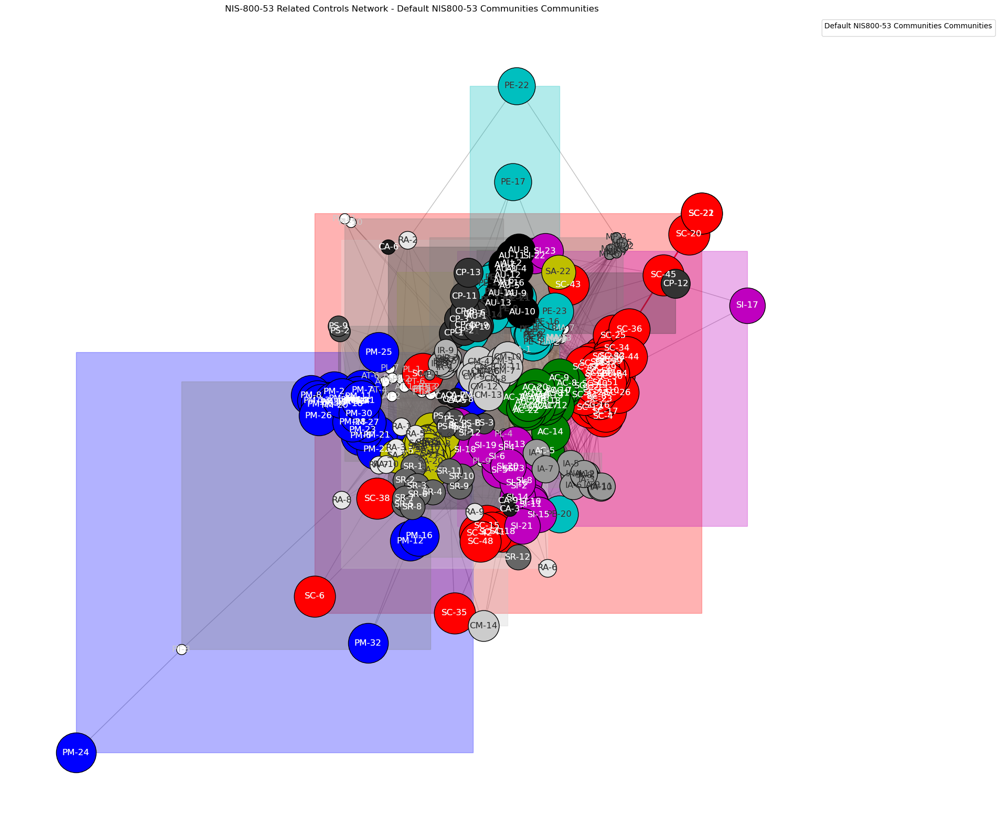

Visualizing async_fluid communities...


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


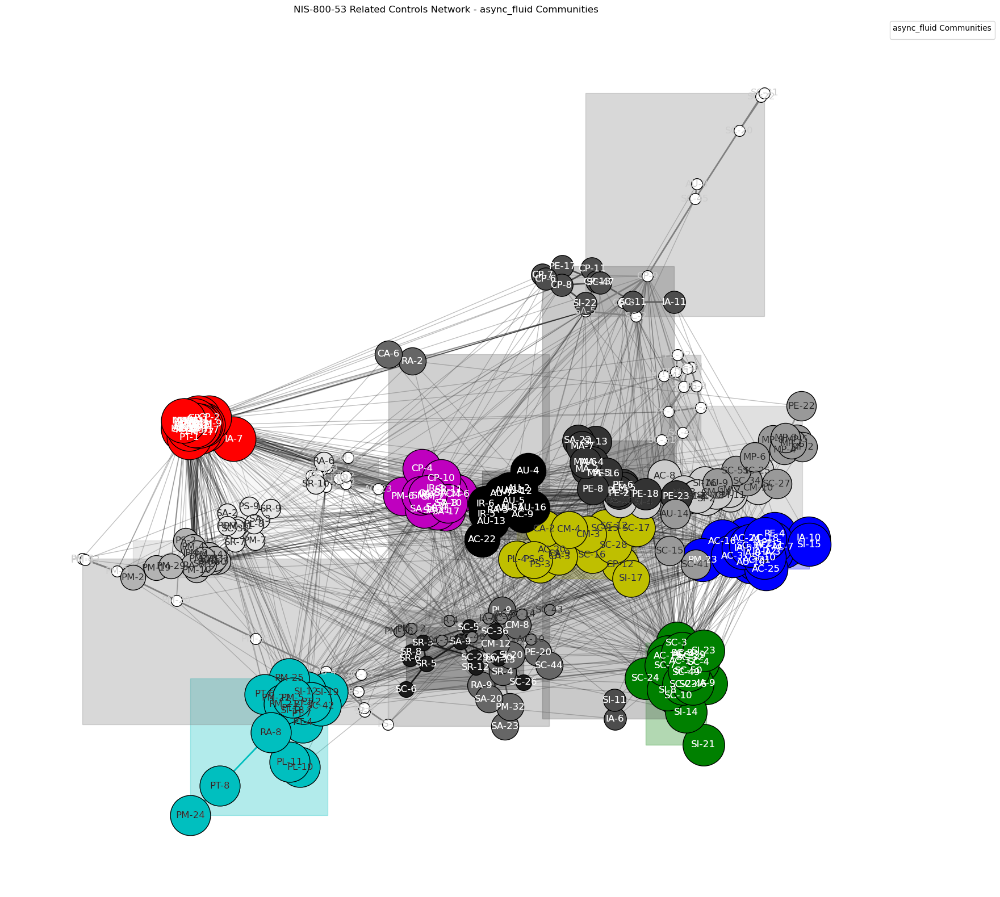

Visualizing greedy_modularity communities...


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


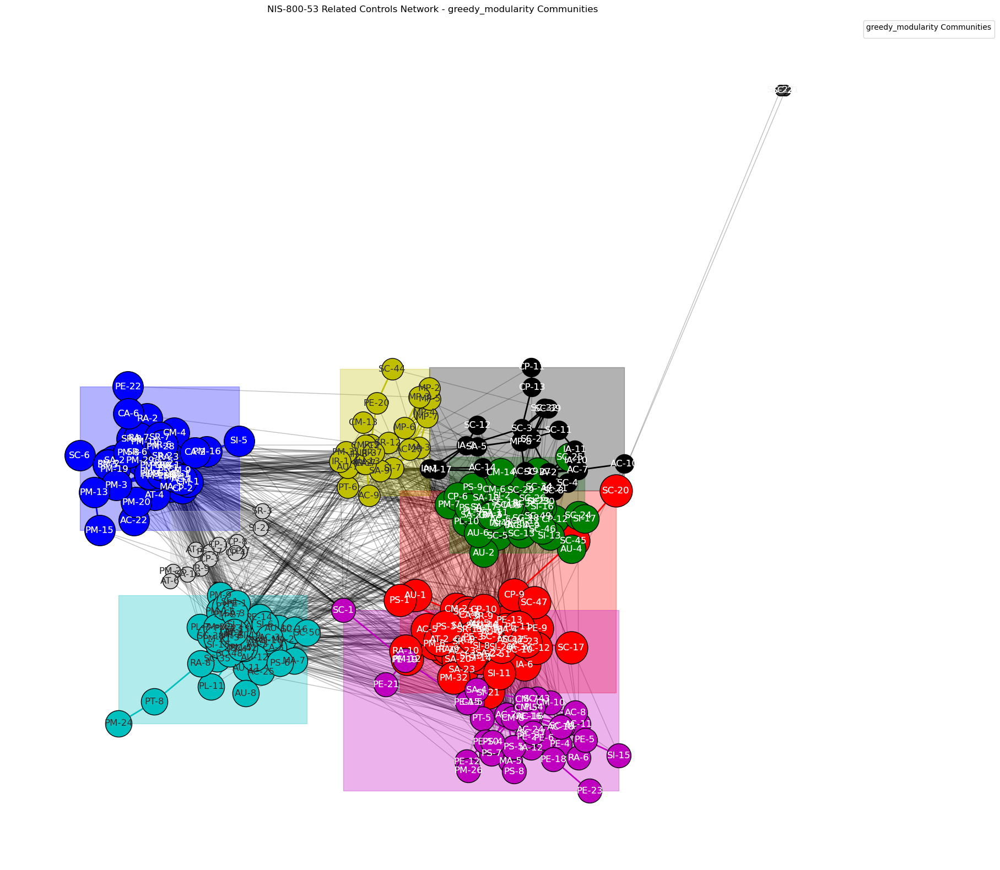

Visualizing leiden communities...


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


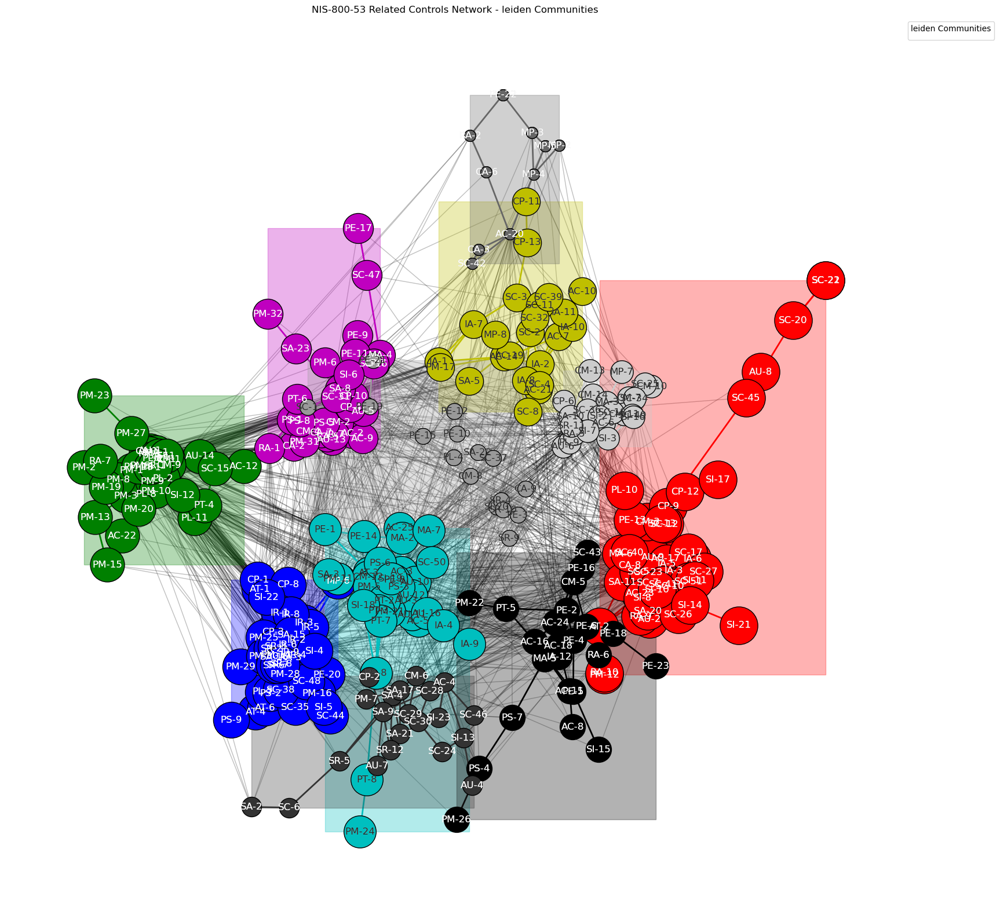

Visualizing louvain communities...


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


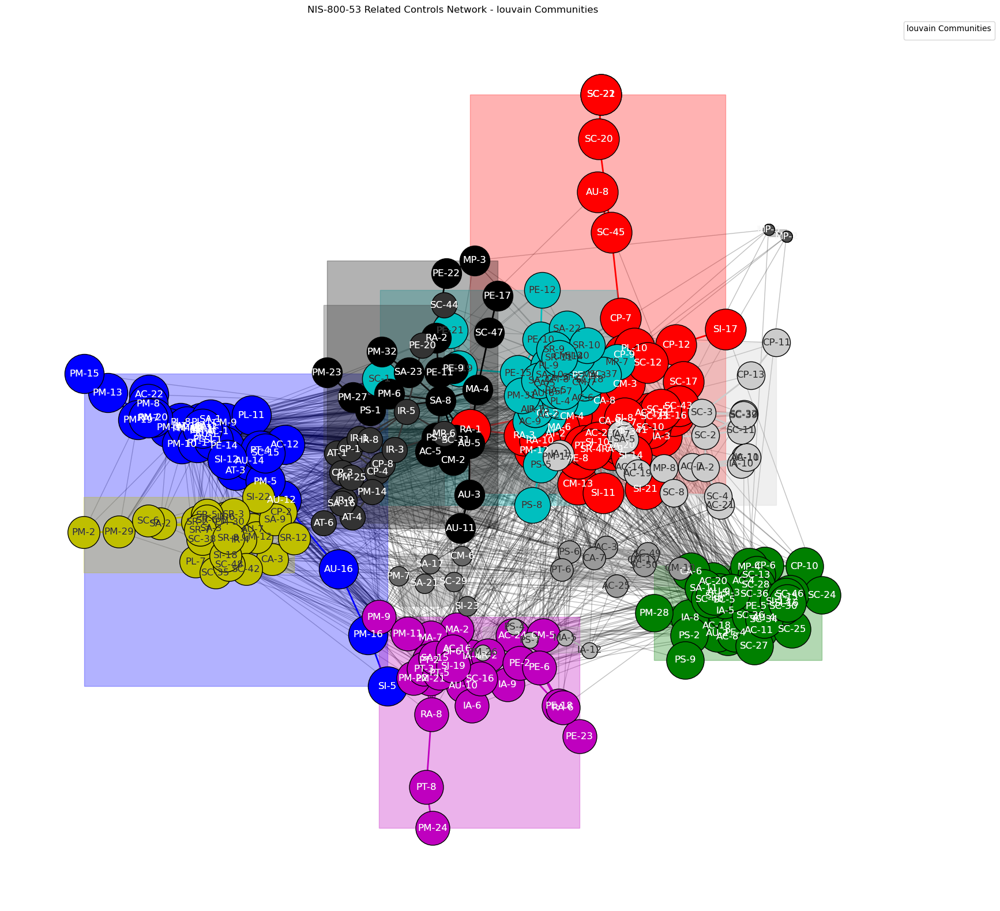

Visualizing pycombo communities...


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


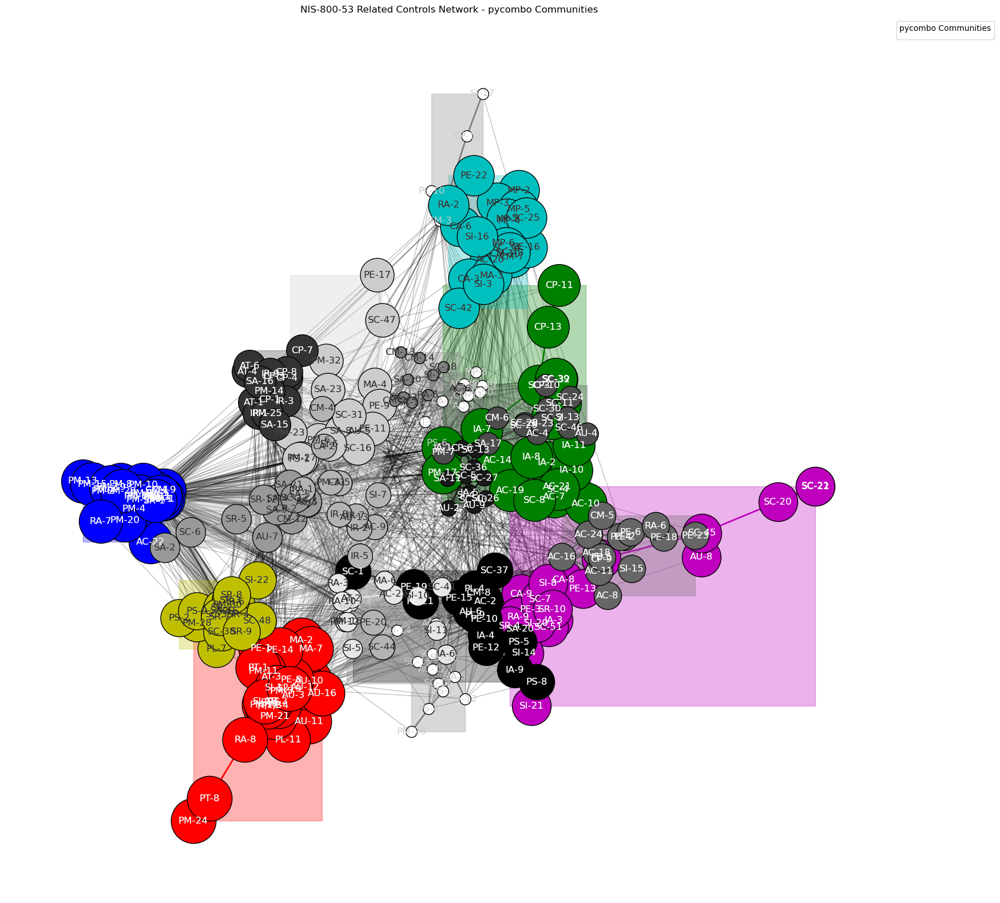

Visualizing rb_pots communities...


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


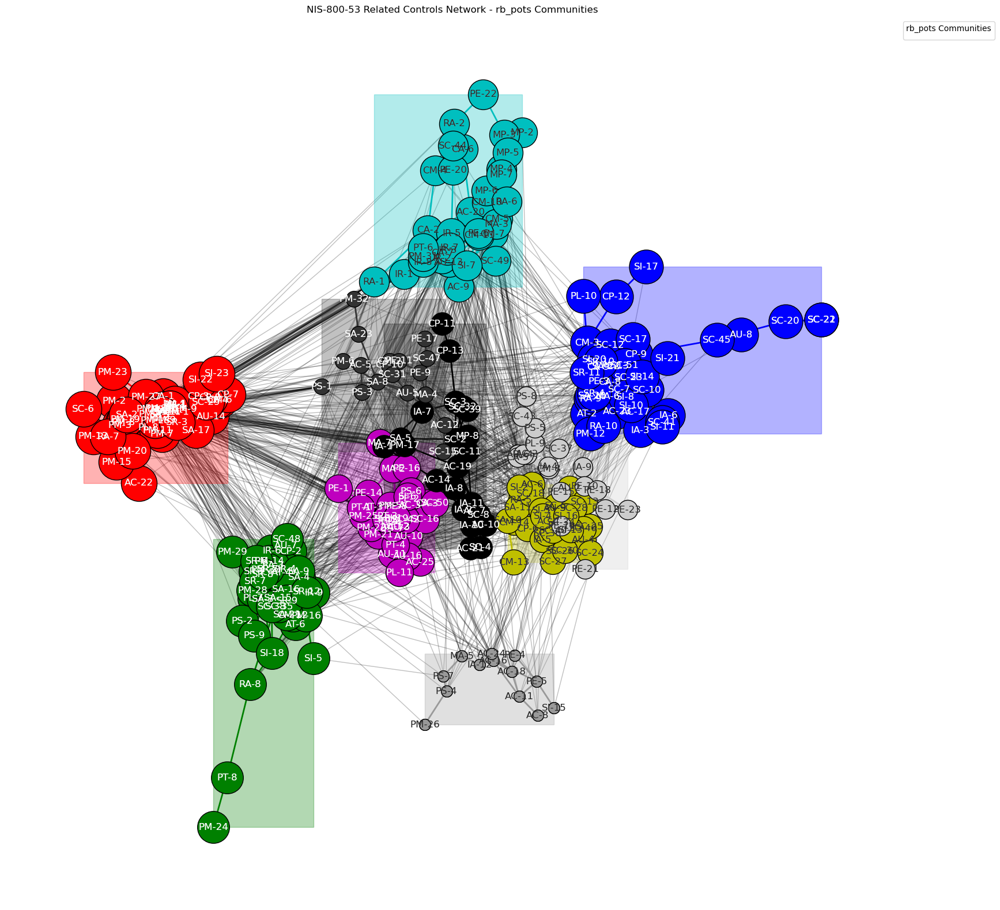

Visualizing r_spectral_clustering communities...


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


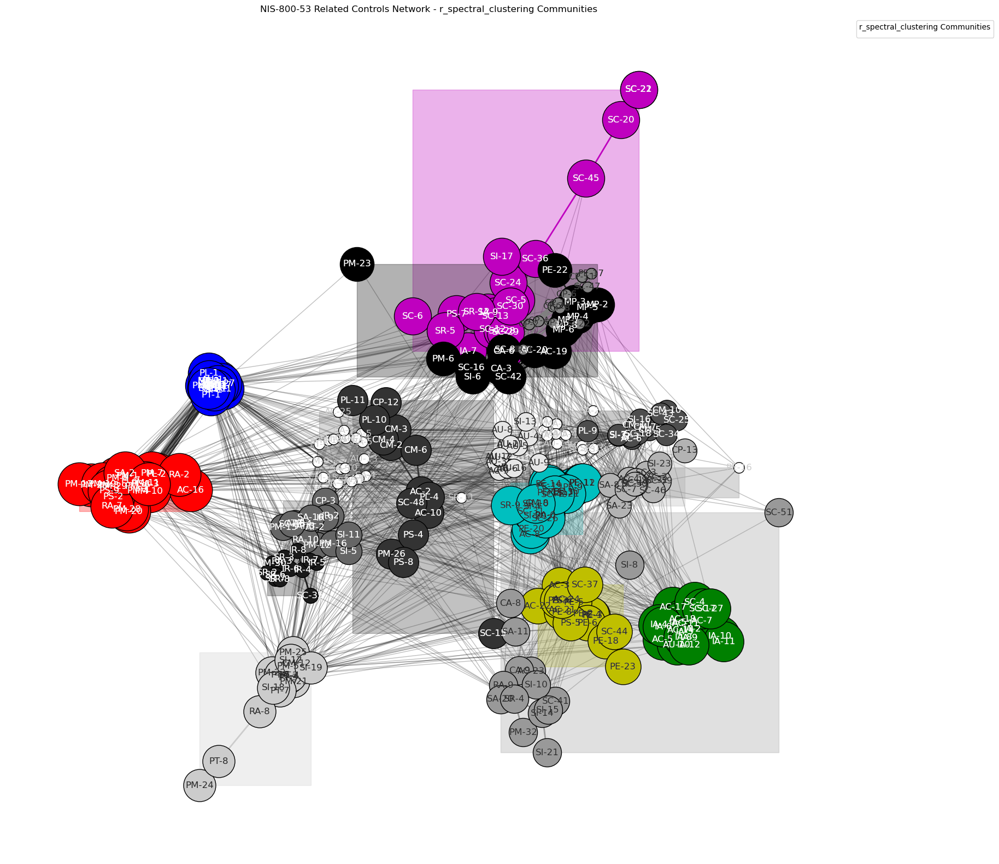

Visualizing spinglass communities...


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


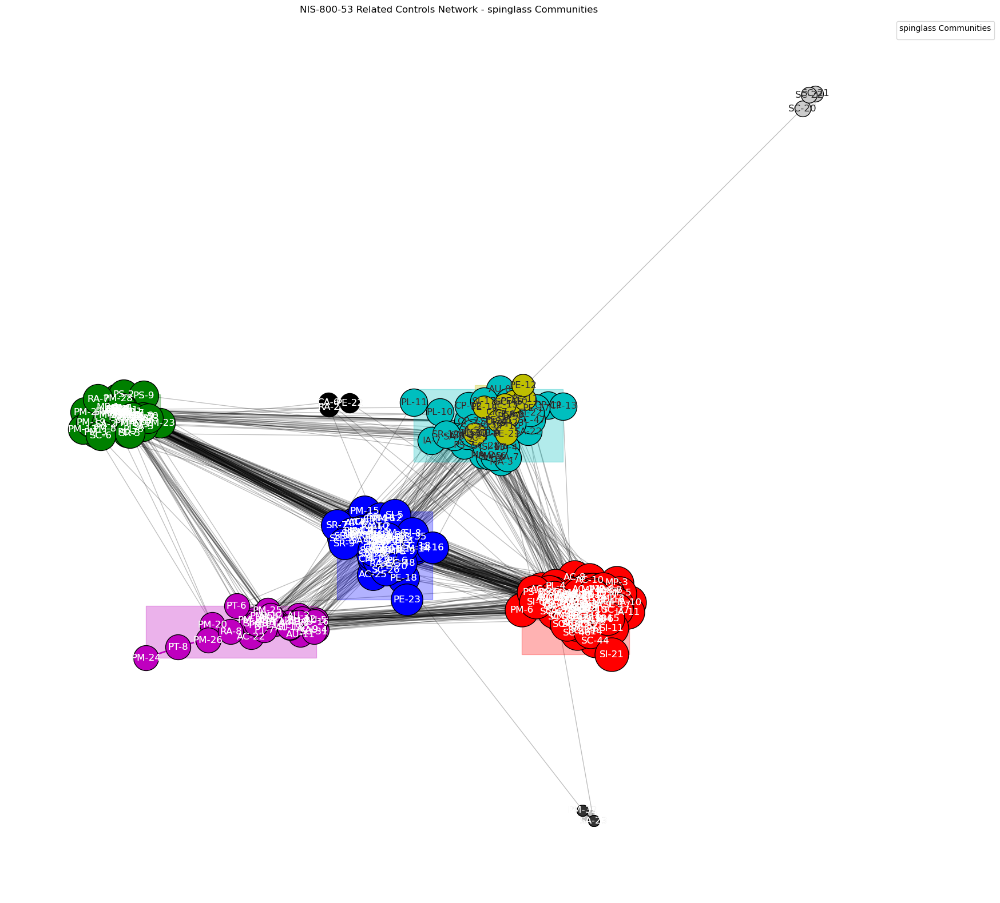

Visualizing conga communities...


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


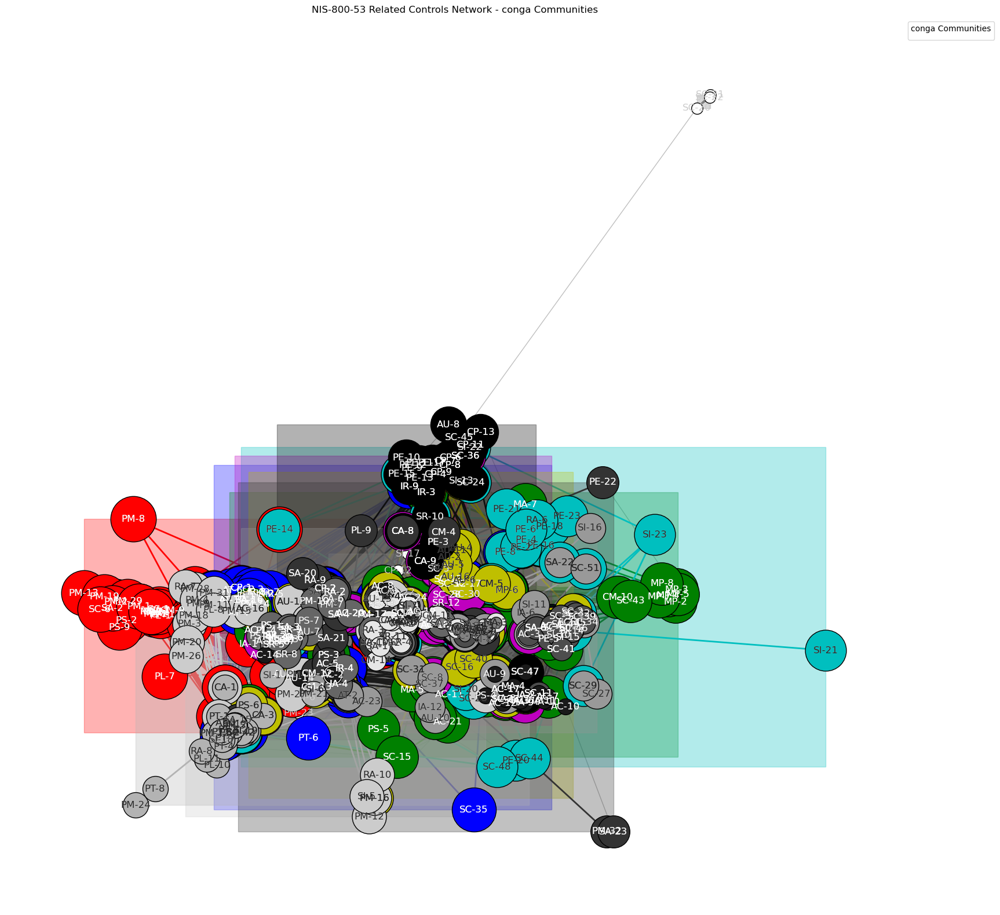

Visualizing endntm2 communities...


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


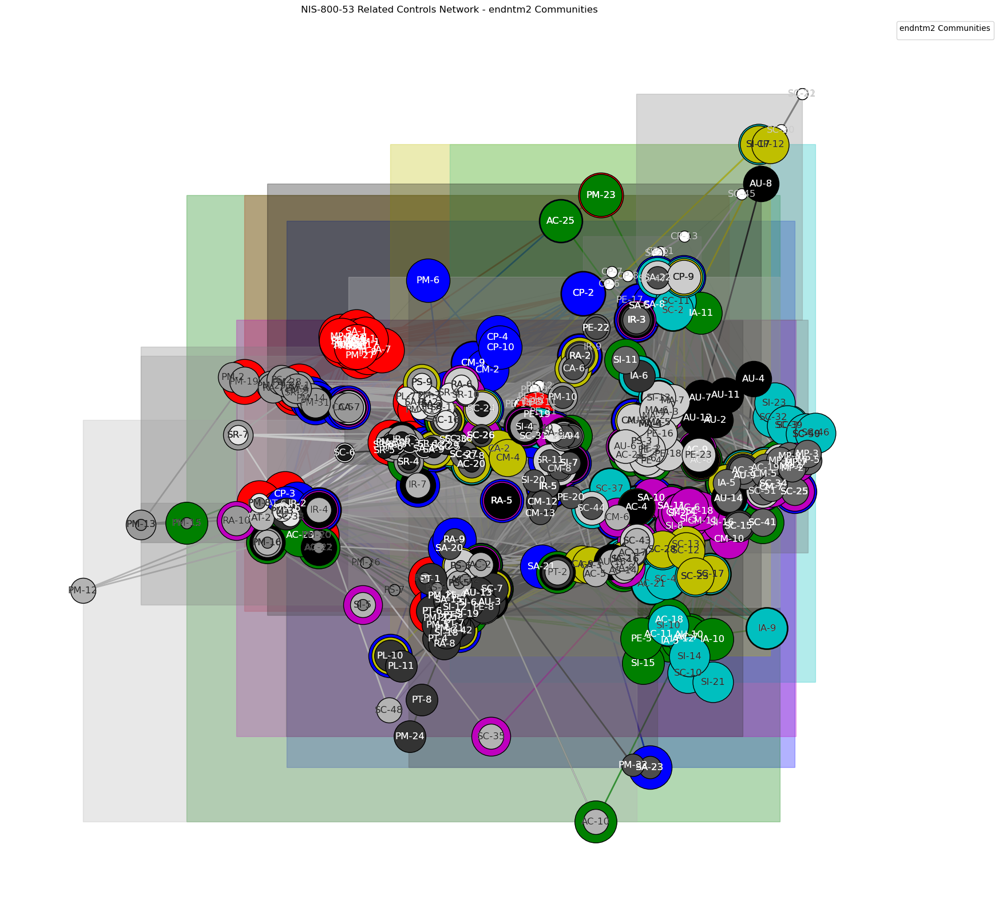

Visualizing endntm3 communities...


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


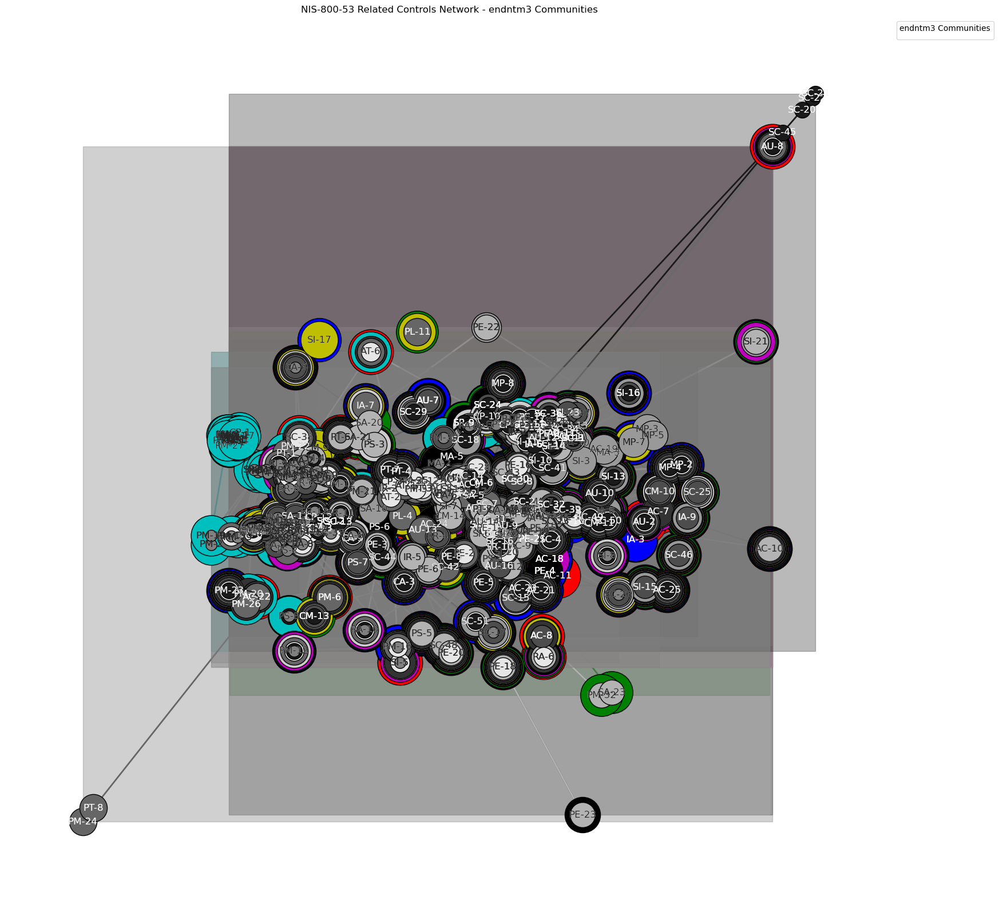

Visualizing endntm2all communities...


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


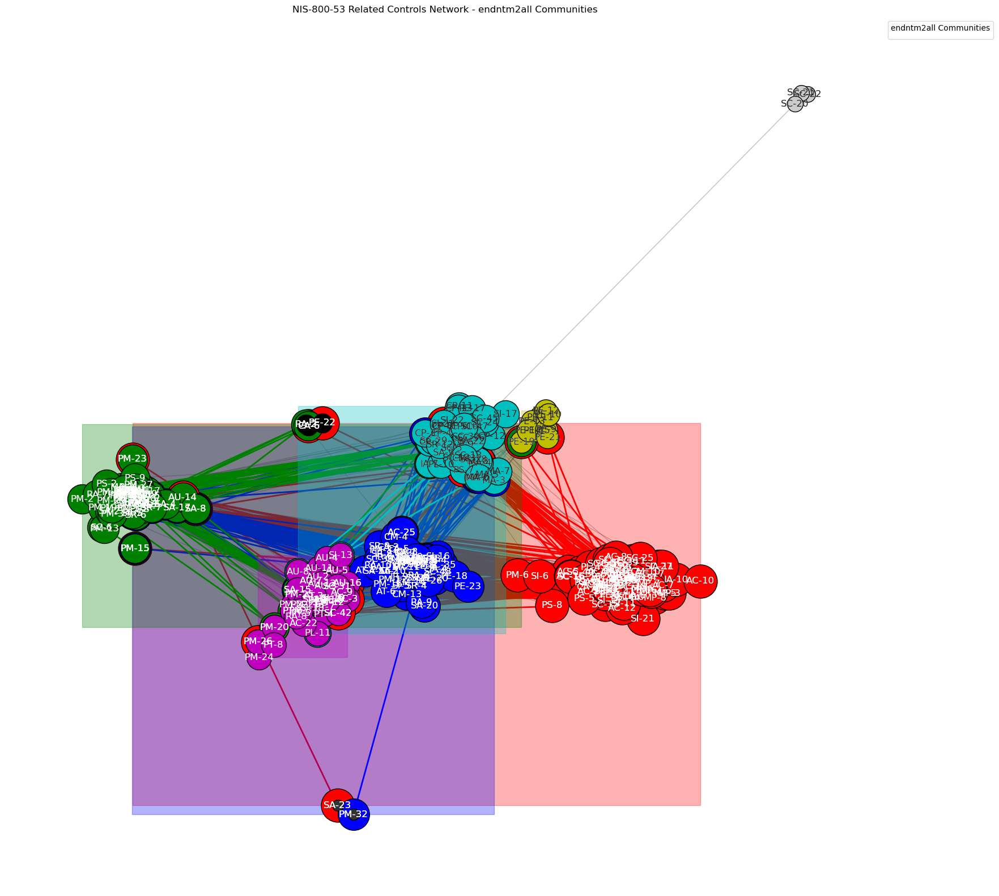

Visualizing endntm3all communities...


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


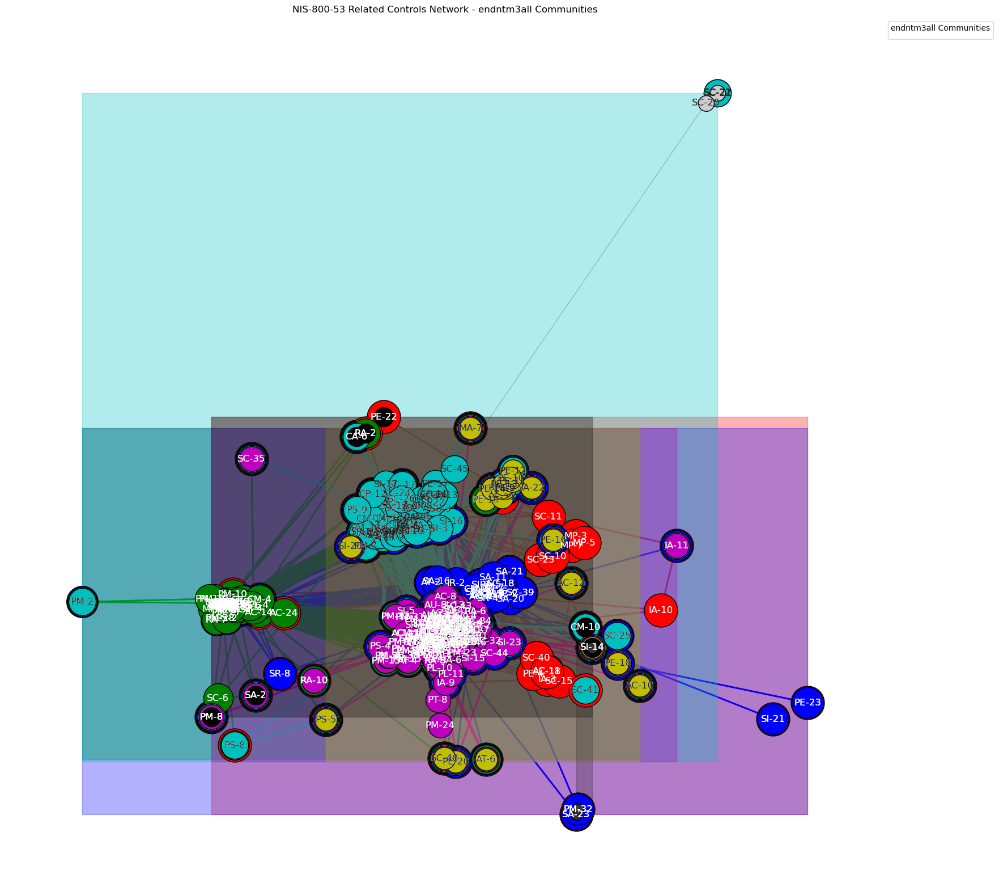

In [ ]:

position = nx.kamada_kawai_layout(Related_Controls_Graph)


# visualize the graph communities of the default communities in a separate figure
print(f"Visualizing {defult_communities.method_name} communities...")
fig = viz.plot_network_highlighted_clusters(Related_Controls_Graph, defult_communities, position,figsize=(20, 20), plot_labels=True, plot_overlaps=True)
plt.title(f"NIS-800-53 Related Controls Network - {defult_communities.method_name} Communities")
plt.legend(title=f"{defult_communities.method_name} Communities", loc='upper left', bbox_to_anchor=(1, 1))
plt.show()


# visualize the graph communities of each method in a separate figure
for key, coms in Crisp_Communities.items():
    print(f"Visualizing {key} communities...")
    fig = viz.plot_network_highlighted_clusters(Related_Controls_Graph, coms, position,figsize=(20, 20), plot_labels=True, plot_overlaps=True)
    plt.title(f"NIS-800-53 Related Controls Network - {key} Communities")
    plt.legend(title=f"{key} Communities", loc='upper left', bbox_to_anchor=(1, 1))
    plt.show()

for key, coms in Overlapping_Communities.items():
    print(f"Visualizing {key} communities...")
    fig = viz.plot_network_highlighted_clusters(Related_Controls_Graph, coms, position,figsize=(20, 20), plot_labels=True, plot_overlaps=True)
    plt.title(f"NIS-800-53 Related Controls Network - {key} Communities")
    plt.legend(title=f"{key} Communities", loc='upper left', bbox_to_anchor=(1, 1))
    plt.show()





# Final Conclusions






In [25]:
# coms
# coms.communities
# len(coms.communities)
# for i, community in enumerate(coms.communities):
#     print(f"Community {i+1}:")
#     print(f"  Size: {len(community)}")
#     print(community)
#     print("-"*80)
# # print the communities in a more readable format
# # for i, community in enumerate(coms.communities):
# #     print(f"Community {i+1}:")
# #     for control in community:
# #         print(f"  - {control}")
# #     print("-"*80)
# # print the number of communities
# print(f"Number of communities: {len(coms.communities)}")

# Related_Controls_Graph.number_of_nodes()
# coms.mi(coms)


In [26]:
# !pip install shuffle_graph>=2.1.0
# !pip install similarity-index-of-label-graph>=2.0.1 
# !pip install ASLPAw>=2.1.0

# Make a network graph based on the "Related Controls" column/s


In [27]:
relations_columns = ["Related Controls Dictionary","bm25 Related Controls","normalized bm25 Related Controls","SentenceTransformer Related Controls","SaaS Related Controls"]

is_directed:bool = False
is_Main_Controls_Only:bool = True
is_Weighted:bool = True

add_groups_summaries:bool = False

i:int=1
Relations = relations_columns[2:] # use the original "Related Controls" column

Related_Controls_Graph = make_network_graph_from_relations(NIS_regulations, Relations, 
                                                           is_directed=is_directed, is_Main_Controls_Only=is_Main_Controls_Only, is_Weighted=is_Weighted)

c = list(nx.community.k_clique_communities(Related_Controls_Graph.copy(), 6))
# c = nx.community.k_clique_communities(Related_Controls_Graph.copy(), 2)
c
# len(c)
# modularity = nx.community.modularity(Related_Controls_Graph.copy(), c)
# partition_quality = nx.community.quality.partition_quality(Related_Controls_Graph.copy(), c)

# print(f"Partition quality of the communities found: {partition_quality:.4f}")
# print(f"Modularity of the communities found: {modularity:.4f}")
# print the number of communities found
print(f"Number of communities found: {len(c)}")
S = 0
for i, community in enumerate(c):
    print(f"Community {i+1}:")
    print(f"Community size: {len(community)}")
    S += len(community)
    print(community)
    print("-"*80)


S


number of nodes in graph: 298
number of edges in graph: 0
number of nodes in graph: 298
number of edges in graph: 0
number of nodes in graph: 298
number of edges in graph: 1875
Number of communities found: 12
Community 1:
Community size: 40
frozenset({'CM-9', 'CA-1', 'PM-1', 'AT-1', 'PM-17', 'MA-1', 'PM-9', 'CP-2', 'IA-1', 'SA-5', 'PL-1', 'PM-27', 'PM-29', 'PM-30', 'PM-18', 'PM-11', 'SA-1', 'CP-1', 'RA-1', 'SR-1', 'SR-3', 'PL-8', 'CM-1', 'RA-3', 'AU-1', 'PT-1', 'AC-1', 'SR-2', 'PM-28', 'PS-1', 'SC-1', 'PM-14', 'SI-1', 'IR-8', 'PE-1', 'PL-2', 'SA-3', 'PM-4', 'IR-1', 'MP-1'})
--------------------------------------------------------------------------------
Community 2:
Community size: 6
frozenset({'SA-10', 'SA-15', 'SA-4', 'SA-17', 'SA-21', 'SA-11'})
--------------------------------------------------------------------------------
Community 3:
Community size: 11
frozenset({'IR-4', 'SI-4', 'IR-8', 'IR-5', 'IR-3', 'IR-2', 'IR-6', 'CP-2', 'SA-15', 'IR-1', 'IR-7'})
----------------------------

131